In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


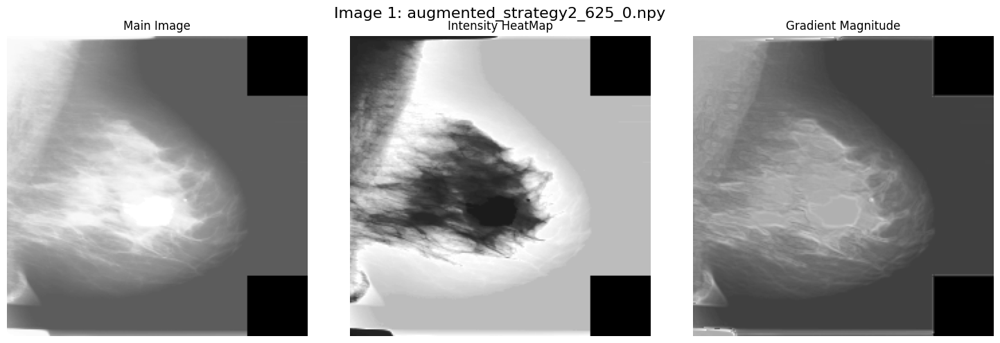

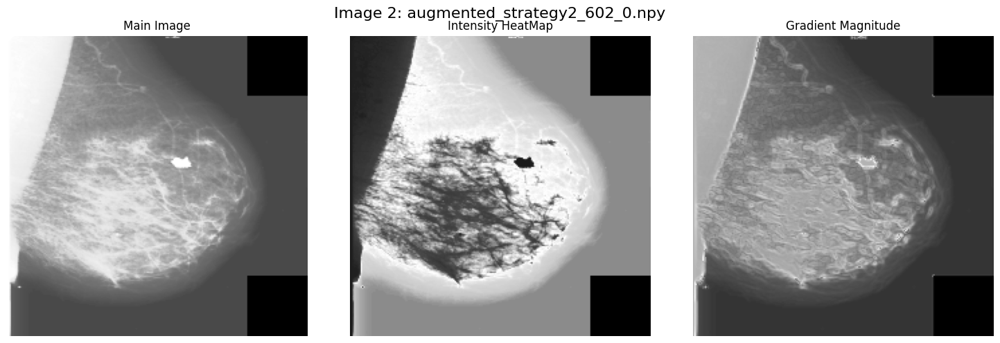

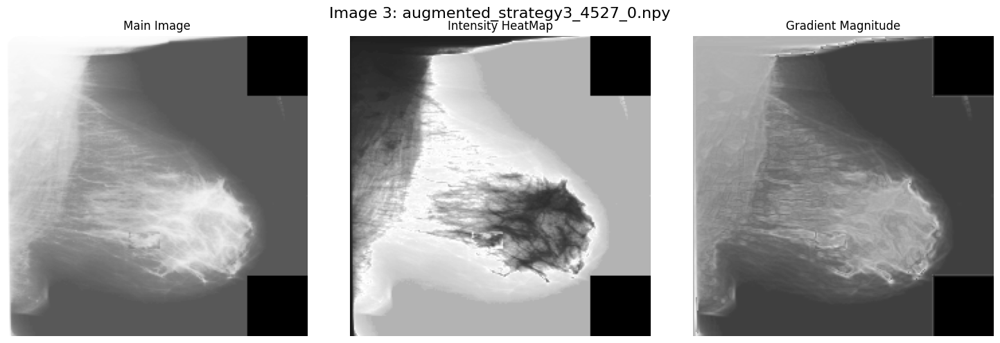

In [5]:
import numpy as np
import os
import matplotlib.pyplot as plt

# Example paths (replace with actual paths if running locally or on Kaggle)
dataset_path = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"

# List all .npy files in the dataset
try:
    all_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.npy')]

    # Visualize each image (limiting to 3 for demonstration purposes)
    for idx, image_path in enumerate(all_paths[:3]):  # Adjust number as needed
        # Load the preprocessed image
        image = np.load(image_path)

        # Extract channels
        if image.ndim == 3 and image.shape[-1] >= 3:  # Ensure valid shape
            main_image = image[:, :, 0]  # Main preprocessed image
            edges = image[:, :, 1]       # Edge-detected image
            gradient = image[:, :, 2]    # Gradient magnitude image

            # Plot the channels
            plt.figure(figsize=(15, 5))
            plt.suptitle(f"Image {idx + 1}: {os.path.basename(image_path)}", fontsize=16)

            # Main image
            plt.subplot(1, 3, 1)
            plt.imshow(main_image, cmap="gray")
            plt.title("Main Image")
            plt.axis("off")

            # Edge detection
            plt.subplot(1, 3, 2)
            plt.imshow(edges, cmap="gray")
            plt.title("Intensity HeatMap")
            plt.axis("off")

            # Gradient magnitude
            plt.subplot(1, 3, 3)
            plt.imshow(gradient, cmap="gray")
            plt.title("Gradient Magnitude")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
        else:
            print(f"Skipping file {os.path.basename(image_path)}: Invalid dimensions {image.shape}")

except FileNotFoundError as e:
    print(f"Error: {e}. Please ensure the path is correct and the files exist.")


Found valid indices with at least 2 strategies:

Plotting Index: 625


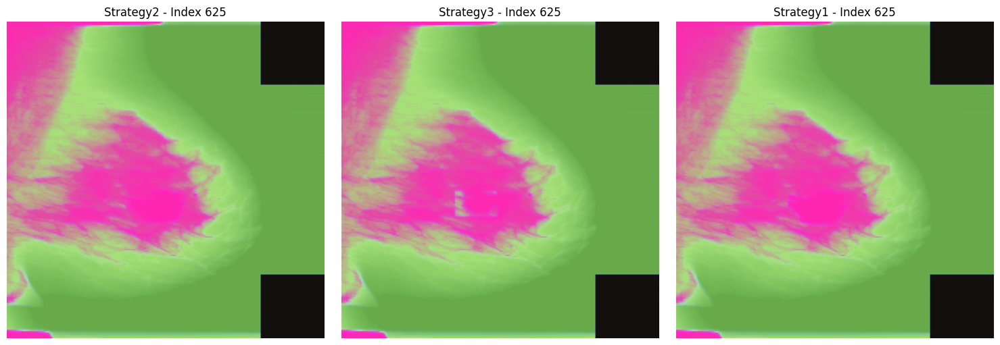


Plotting Index: 602


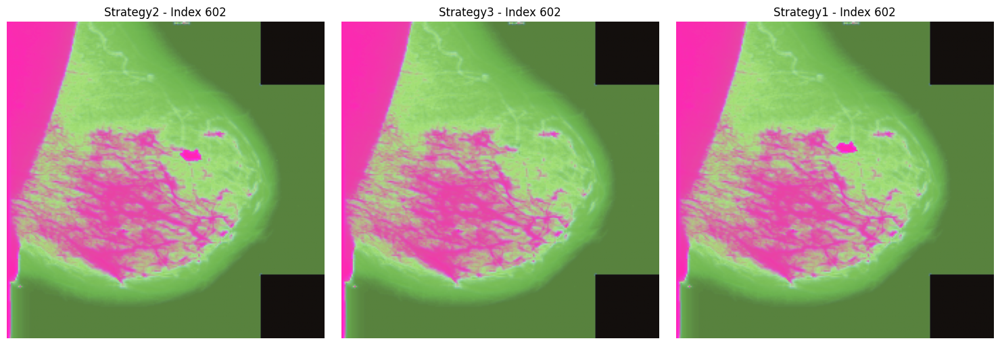


Plotting Index: 4527


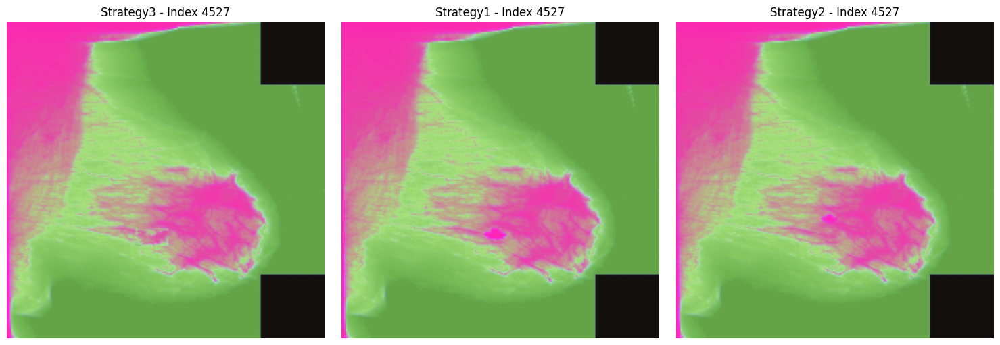


Plotting Index: 2835


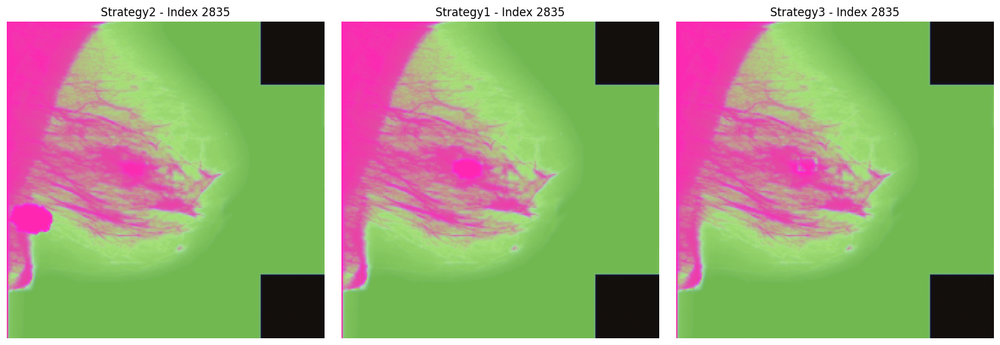


Plotting Index: 4714


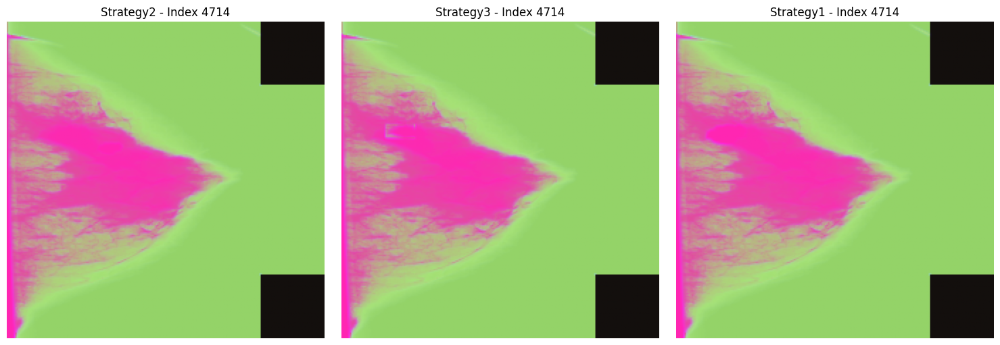

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Define the directory
data_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"

# Function to group files by their index
def group_files_by_index(directory):
    strategy_groups = defaultdict(list)
    for file in os.listdir(directory):
        if file.endswith(".npy") and "augmented_strategy" in file:
            parts = file.split('_')
            strategy = parts[1]  # strategy1, strategy2, strategy3
            index = parts[2]     # index part
            strategy_groups[index].append((strategy, file))
    return strategy_groups

# Function to load and plot the files for a given index
def load_and_plot_files(index, files, directory):
    fig, axes = plt.subplots(1, len(files), figsize=(5 * len(files), 5))
    if len(files) == 1:
        axes = [axes]  # Handle single plot case

    for ax, (strategy, filename) in zip(axes, files):
        file_path = os.path.join(directory, filename)
        data = np.load(file_path)
        ax.imshow(data, cmap='gray')
        ax.set_title(f"{strategy.capitalize()} - Index {index}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Main Execution
if __name__ == "__main__":
    if os.path.exists(data_dir):
        # Group files and filter for indices with at least 2 strategies
        grouped_files = group_files_by_index(data_dir)
        valid_indices = {idx: files for idx, files in grouped_files.items() if len(files) >= 2}
        
        # Select up to 5 examples
        print("Found valid indices with at least 2 strategies:")
        selected_examples = list(valid_indices.items())[:5]
        for idx, files in selected_examples:
            print(f"\nPlotting Index: {idx}")
            load_and_plot_files(idx, files, data_dir)
    else:
        print(f"The directory {data_dir} does not exist.")


In [7]:
import os
import shutil

# Define directories
benign_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"
malignant_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Malignant"
output_dir = "/kaggle/working/strategy1_dataset"  # Directory to save strategy1 files

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Function to save strategy1 files from a directory
def save_strategy1_files(source_dir, target_dir):
    count = 0
    for file in os.listdir(source_dir):
        if file.endswith(".npy") and "strategy1" in file:  # Check for strategy1 files
            source_path = os.path.join(source_dir, file)
            target_path = os.path.join(target_dir, file)
            shutil.copy(source_path, target_path)  # Copy file to target directory
            count += 1
    return count

# Main execution
if __name__ == "__main__":
    print("Saving strategy1 files...")

    # Process Benign directory
    benign_count = save_strategy1_files(benign_dir, output_dir)
    print(f"Saved {benign_count} strategy1 files from Benign directory.")

    # Process Malignant directory
    malignant_count = save_strategy1_files(malignant_dir, output_dir)
    print(f"Saved {malignant_count} strategy1 files from Malignant directory.")

    print(f"\nTotal strategy1 files saved: {benign_count + malignant_count}")
    print(f"Files are saved in: {output_dir}")



Saving strategy1 files...
Saved 2676 strategy1 files from Benign directory.
Saved 2308 strategy1 files from Malignant directory.

Total strategy1 files saved: 4984
Files are saved in: /kaggle/working/strategy1_dataset


In [8]:
import os
import shutil

# Define directories
benign_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"
malignant_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Malignant"
output_dir = "/kaggle/working/strategy1_dataset"

# Subdirectories for benign and malignant
output_benign = os.path.join(output_dir, "benign")
output_malignant = os.path.join(output_dir, "malignant")

# Function to clean output directories
def clean_directory(directory):
    if os.path.exists(directory):
        shutil.rmtree(directory)
    os.makedirs(directory)

# Function to copy and rename files with labels
def save_and_label_files(source_dir, target_dir, label):
    count = 0
    for file in os.listdir(source_dir):
        if file.endswith(".npy") and "strategy1" in file:
            source_path = os.path.join(source_dir, file)
            # Modify filename to include label
            base_name = "_".join(file.split("_")[:3])  # Keeps augmented_strategy1_3548
            new_file = f"{base_name}_{label}.npy"     # Add label _0_ or _1_
            target_path = os.path.join(target_dir, new_file)
            shutil.copy(source_path, target_path)
            count += 1
    return count

# Main execution
if __name__ == "__main__":
    print("Cleaning output directories...")
    clean_directory(output_dir)
    clean_directory(output_benign)
    clean_directory(output_malignant)
    
    print("Saving and labeling strategy1 files...")

    # Process Benign directory with _0_ label
    benign_count = save_and_label_files(benign_dir, output_benign, "0")
    print(f"Saved and labeled {benign_count} strategy1 files from Benign directory.")

    # Process Malignant directory with _1_ label
    malignant_count = save_and_label_files(malignant_dir, output_malignant, "1")
    print(f"Saved and labeled {malignant_count} strategy1 files from Malignant directory.")

    print("\nSummary:")
    print(f"Benign files saved: {benign_count}")
    print(f"Malignant files saved: {malignant_count}")
    print(f"Files are saved in: {output_dir}")


Cleaning output directories...
Saving and labeling strategy1 files...
Saved and labeled 2676 strategy1 files from Benign directory.
Saved and labeled 2308 strategy1 files from Malignant directory.

Summary:
Benign files saved: 2676
Malignant files saved: 2308
Files are saved in: /kaggle/working/strategy1_dataset


In [9]:
import os
import numpy as np
from concurrent.futures import ThreadPoolExecutor

# 2. Define Directories
benign_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"
malignant_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Malignant"

# 3. Compute Dataset-Specific Mean and Std (Parallelized)
def process_file(file_path):
    image = np.load(file_path).astype(np.float32) / 255.0
    return np.sum(image, axis=(0, 1)), np.sum(image ** 2, axis=(0, 1)), image.shape[0] * image.shape[1]

def compute_mean_std(data_dirs):
    sum_images = 0.0
    sum_squared_images = 0.0
    num_pixels = 0
    file_paths = []

    for data_dir in data_dirs:
        file_paths += [os.path.join(data_dir, file) for file in os.listdir(data_dir) if file.endswith('.npy')]

    with ThreadPoolExecutor() as executor:
        results = list(executor.map(process_file, file_paths))

    for s, s2, pixels in results:
        sum_images += s
        sum_squared_images += s2
        num_pixels += pixels

    mean = sum_images / num_pixels
    std = np.sqrt((sum_squared_images / num_pixels) - mean ** 2)
    return mean, std

mean, std = compute_mean_std([benign_dir, malignant_dir])
print(f"Computed Mean: {mean}, Std: {std}")

Computed Mean: [0.00237972 0.0023751  0.00174674], Std: [0.00088792 0.00102896 0.00067923]


In [10]:
#!pip install torchsummary

In [117]:
MODEL_SAVE_PATH = "resnet50_cbis_trained_model.pth"

# Save the model's state_dict
torch.save(model.state_dict(), MODEL_SAVE_PATH)
print(f"Model saved successfully to {MODEL_SAVE_PATH}")


Model saved successfully to resnet50_cbis_trained_model.pth


In [ ]:
# Load the saved model
model = models.resnet50(weights="IMAGENET1K_V2")

# Modify the architecture to match the saved model
for name, param in model.named_parameters():
    if "layer4" not in name and "fc" not in name:
        param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 1)
)

# Load the saved state_dict
model.load_state_dict(torch.load(MODEL_SAVE_PATH))
model = model.to(device)

print("Model loaded successfully and ready for inference!")


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
import numpy as np
import os

# 1. Data Paths
benign_dir = "/kaggle/working/strategy1_dataset/benign"
malignant_dir = "/kaggle/working/strategy1_dataset/malignant"

# Collect all file paths
benign_files = [os.path.join(benign_dir, f) for f in os.listdir(benign_dir) if f.endswith('.npy')]
malignant_files = [os.path.join(malignant_dir, f) for f in os.listdir(malignant_dir) if f.endswith('.npy')]

# Split data into train and test
benign_train, benign_test = train_test_split(benign_files, test_size=0.2, random_state=42)
malignant_train, malignant_test = train_test_split(malignant_files, test_size=0.2, random_state=42)

# Calculate Class Weights BEFORE initializing dataset
benign_count = len(benign_train)
malignant_count = len(malignant_train)
class_weights = torch.tensor([1.0, benign_count / malignant_count]).to("cuda" if torch.cuda.is_available() else "cpu")

# 2. Custom Dataset
class Custom3ChannelDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.files = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        image = np.load(self.files[idx])

        if image.ndim == 2:
            image = np.stack([image] * 3, axis=0) 
        elif image.shape[0] != 3:
            image = image[:3, :, :] 
        
        image = torch.tensor(image, dtype=torch.float32)
        if self.transform:
            image = self.transform(image)

        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        return image, label


In [13]:

# 3. Data Transformations
transform = transforms.Compose([
    transforms.Normalize(mean=[0.00237972, 0.0023751,  0.00174674], std=[0.00088792, 0.00102896, 0.00067923])
])

# 4. Combine Files and Labels
train_files = benign_train + malignant_train
train_labels = [0] * len(benign_train) + [1] * len(malignant_train)

test_files = benign_test + malignant_test
test_labels = [0] * len(benign_test) + [1] * len(malignant_test)

# Initialize Datasets and DataLoaders
train_dataset = Custom3ChannelDataset(train_files, train_labels, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

test_dataset = Custom3ChannelDataset(test_files, test_labels, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

print(f"Benign Count: {benign_count}, Malignant Count: {malignant_count}")
print(f"Class Weights: {class_weights}")

Benign Count: 2140, Malignant Count: 1846
Class Weights: tensor([1.0000, 1.1593], device='cuda:0')


In [18]:
# 5. Modified ResNet50 Model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.resnet50(weights="IMAGENET1K_V2")

# Freeze Early Layers
for name, param in model.named_parameters():
    if "layer4" not in name and "fc" not in name:
        param.requires_grad = False

# Replace Fully Connected Layer
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 1)  # No Sigmoid
)

model = model.to(device)

# 6. Loss Function and Optimizer
criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights[1])  # Apply class weights

optimizer = optim.Adam([
    {'params': model.layer4.parameters(), 'lr': 1e-4},
    {'params': model.fc.parameters(), 'lr': 1e-3}
])



Epoch 1/15 | Train Loss: 0.7144 | Test Loss: 0.6778 | Accuracy: 0.6623 | AUC: 0.7089
Epoch 2/15 | Train Loss: 0.6406 | Test Loss: 0.5701 | Accuracy: 0.7315 | AUC: 0.8159
Epoch 3/15 | Train Loss: 0.5356 | Test Loss: 0.6300 | Accuracy: 0.6994 | AUC: 0.7923
Epoch 4/15 | Train Loss: 0.4711 | Test Loss: 0.4232 | Accuracy: 0.8136 | AUC: 0.9035
Epoch 5/15 | Train Loss: 0.4318 | Test Loss: 0.3209 | Accuracy: 0.8567 | AUC: 0.9469
Epoch 6/15 | Train Loss: 0.3650 | Test Loss: 0.2973 | Accuracy: 0.8878 | AUC: 0.9568
Epoch 7/15 | Train Loss: 0.3072 | Test Loss: 0.2848 | Accuracy: 0.8898 | AUC: 0.9644
Epoch 8/15 | Train Loss: 0.3233 | Test Loss: 0.2351 | Accuracy: 0.9128 | AUC: 0.9733
Epoch 9/15 | Train Loss: 0.2896 | Test Loss: 0.2223 | Accuracy: 0.9259 | AUC: 0.9783
Epoch 10/15 | Train Loss: 0.2525 | Test Loss: 0.2336 | Accuracy: 0.9259 | AUC: 0.9784
Epoch 11/15 | Train Loss: 0.2524 | Test Loss: 0.1957 | Accuracy: 0.9359 | AUC: 0.9829
Epoch 12/15 | Train Loss: 0.2469 | Test Loss: 0.1666 | Accuracy

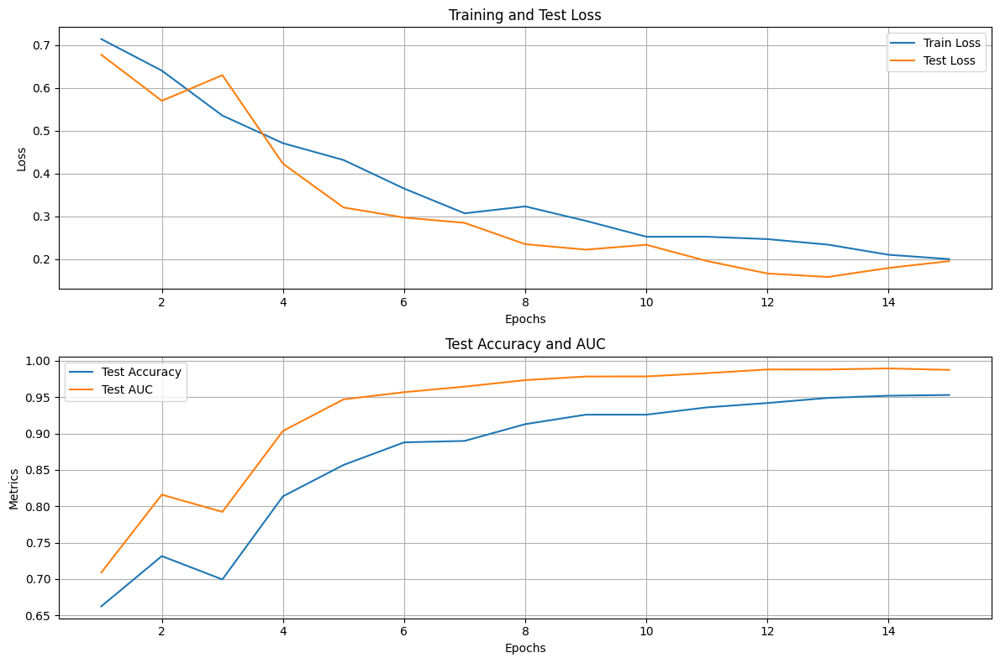

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import roc_auc_score, accuracy_score
import matplotlib.pyplot as plt

# Initialize variables to track metrics
train_losses = []
test_losses = []
test_accuracies = []
test_roc_aucs = []

# Training and Evaluation Loop
num_epochs = 15
for epoch in range(num_epochs):
    # Training Phase
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.unsqueeze(1).float().to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  # Gradient Clipping
        optimizer.step()
        
        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Evaluation Phase
    model.eval()
    all_outputs = []
    all_labels = []
    test_running_loss = 0.0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.unsqueeze(1).float().to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_running_loss += loss.item()

            # Collect predictions and ground truth
            all_outputs.append(outputs.cpu())
            all_labels.append(labels.cpu())

    # Convert to single tensors
    all_outputs = torch.cat(all_outputs).squeeze()
    all_labels = torch.cat(all_labels).squeeze()

    # Calculate Metrics
    avg_test_loss = test_running_loss / len(test_loader)
    test_losses.append(avg_test_loss)

    predictions = torch.sigmoid(all_outputs) > 0.5  # Binary predictions
    accuracy = accuracy_score(all_labels, predictions)
    roc_auc = roc_auc_score(all_labels, torch.sigmoid(all_outputs))

    test_accuracies.append(accuracy)
    test_roc_aucs.append(roc_auc)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {avg_train_loss:.4f} | Test Loss: {avg_test_loss:.4f} | "
          f"Accuracy: {accuracy:.4f} | AUC: {roc_auc:.4f}")

# Plot Metrics
epochs = range(1, num_epochs + 1)
plt.figure(figsize=(12, 8))

# Loss Plot
plt.subplot(2, 1, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()
plt.grid()

# Accuracy and AUC Plot
plt.subplot(2, 1, 2)
plt.plot(epochs, test_accuracies, label='Test Accuracy')
plt.plot(epochs, test_roc_aucs, label='Test AUC')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.title('Test Accuracy and AUC')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


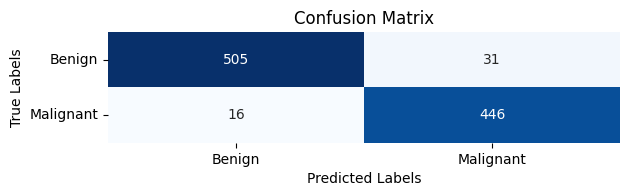

Classification Report:
              precision    recall  f1-score   support

      Benign       0.97      0.94      0.96       536
   Malignant       0.94      0.97      0.95       462

    accuracy                           0.95       998
   macro avg       0.95      0.95      0.95       998
weighted avg       0.95      0.95      0.95       998



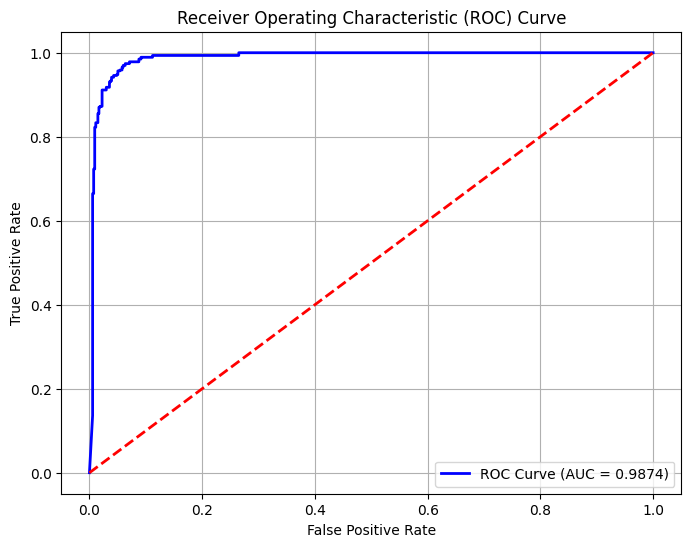

In [28]:
from sklearn.metrics import (
    roc_auc_score, accuracy_score, confusion_matrix, classification_report, roc_curve, auc
)
probabilities = torch.sigmoid(all_outputs)
predictions = probabilities > 0.5  # Binary predictions

# Final Evaluation on Test Set
conf_matrix = confusion_matrix(all_labels, predictions)
report = classification_report(all_labels, predictions, target_names=["Benign", "Malignant"])

# Confusion Matrix Plot
plt.subplot(3, 1, 3)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, 
            xticklabels=["Benign", "Malignant"], yticklabels=["Benign", "Malignant"])
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")

plt.tight_layout()
plt.show()

# Print Classification Report
print("Classification Report:")
print(report)

# ROC Curve Plot
fpr, tpr, _ = roc_curve(all_labels, probabilities)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], color='red', linestyle='--', lw=2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid()
plt.show()


In [57]:
# Check Trainable and Frozen Parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen_params = total_params - trainable_params

print(f"\nTotal Parameters: {total_params:,}")
print(f"Trainable Parameters: {trainable_params:,}")
print(f"Frozen Parameters: {frozen_params:,}")



Total Parameters: 23,770,433
Trainable Parameters: 15,227,137
Frozen Parameters: 8,543,296


# Model Architecture clear

In [50]:
# Function to print the model structure starting from a specific layer
def print_resnet_layer_flow(model, start_layer_name):
    # Traverse the model to isolate the starting layer
    start_flag = False
    print(f"\nFlow of Layers Starting from '{start_layer_name}':\n{'='*60}")
    for name, layer in model.named_modules():
        if name == start_layer_name:
            start_flag = True  # Start printing from this layer
        if start_flag:
            print(f"Layer: {name}\n{layer}\n{'-'*60}")
        if "fc" in name:  # Stop at the final fully connected layer
            break

# Example Usage
print_resnet_layer_flow(model, "layer1.0.conv1")



Flow of Layers Starting from 'layer1.0.conv1':
Layer: layer1.0.conv1
Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
------------------------------------------------------------
Layer: layer1.0.bn1
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
------------------------------------------------------------
Layer: layer1.0.conv2
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
------------------------------------------------------------
Layer: layer1.0.bn2
BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
------------------------------------------------------------
Layer: layer1.0.conv3
Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
------------------------------------------------------------
Layer: layer1.0.bn3
BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
------------------------------------------------------------
Layer: layer1.0.

Original Image Shape: (224, 224, 3)


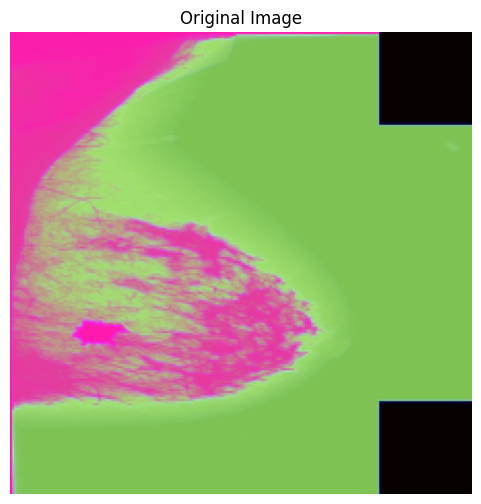

Feature Map Shape at 'layer1.0.conv1': torch.Size([64, 56, 56])


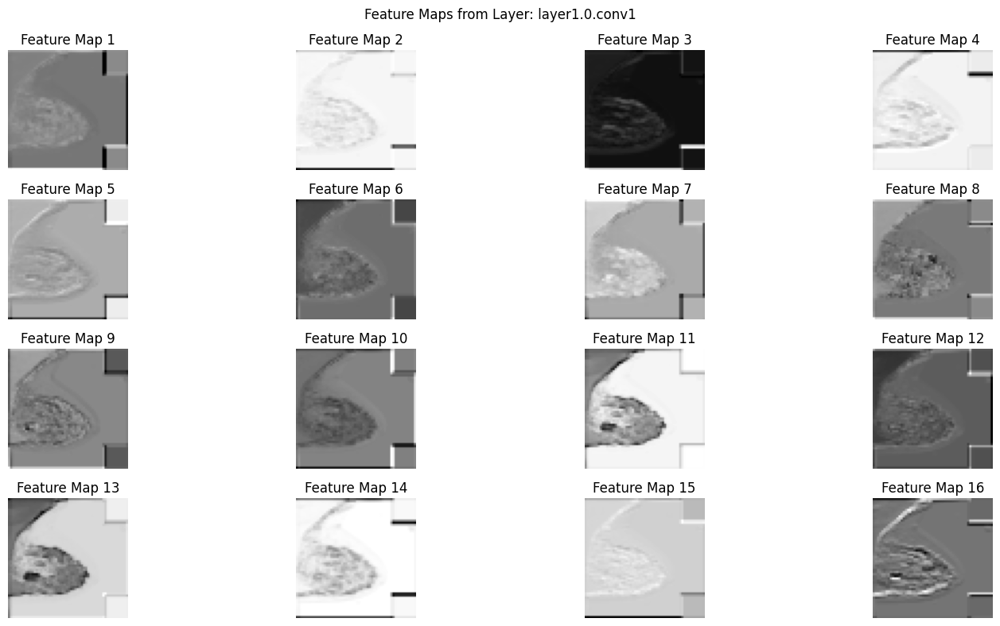

In [53]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
import torch.nn.functional as F

# Function to visualize feature maps for an .npy image at a specific layer
def visualize_feature_maps_npy(model, npy_path, target_layer_name):
    model.eval()
    activation = {}

    # Hook to capture activations at the target layer
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook

    # Register forward hook for the specified layer
    for name, layer in model.named_modules():
        if name == target_layer_name:
            layer.register_forward_hook(get_activation(target_layer_name))

    # 1. Load and preprocess the image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    print("Original Image Shape:", npy_image.shape)
    npy_image_tensor = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize the image
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image_tensor).unsqueeze(0).to(device)  # Add batch dimension
    
    # Plot Original Image
    npy_image_display = npy_image_tensor.permute(1, 2, 0).numpy()  # Back to (H, W, 3)
    npy_image_display = (npy_image_display - npy_image_display.min()) / (npy_image_display.max() - npy_image_display.min())
    
    plt.figure(figsize=(6, 6))
    plt.imshow(npy_image_display)
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

    # 2. Forward pass through the model
    with torch.no_grad():
        _ = model(input_tensor)

    # 3. Extract and visualize the feature maps
    feature_map = activation[target_layer_name].cpu().squeeze()  # Remove batch dimension
    print(f"Feature Map Shape at '{target_layer_name}':", feature_map.shape)  # Should be (num_channels, H, W)

    num_feature_maps = feature_map.shape[0]  # Number of channels

    # Visualize first 16 feature maps
    plt.figure(figsize=(16, 8))
    for i in range(min(16, num_feature_maps)):  # Display up to 16 feature maps
        plt.subplot(4, 4, i + 1)
        plt.imshow(feature_map[i], cmap="gray")
        plt.axis("off")
        plt.title(f"Feature Map {i+1}")
    plt.suptitle(f"Feature Maps from Layer: {target_layer_name}")
    plt.tight_layout()
    plt.show()

# Example Usage
npy_image_path = "/kaggle/working/strategy1_dataset/benign/augmented_strategy1_0_0.npy"  # Replace with your .npy image path
target_layer = "layer1.0.conv1"  # Specify the layer for deep feature map extraction
visualize_feature_maps_npy(model, npy_image_path, target_layer)


### Fully interpretation of what happens to an img on our model

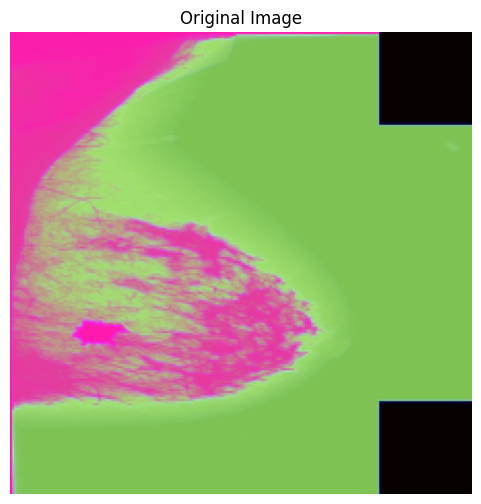

Visualizing Feature Maps for Layer: conv1, Shape: torch.Size([64, 112, 112])


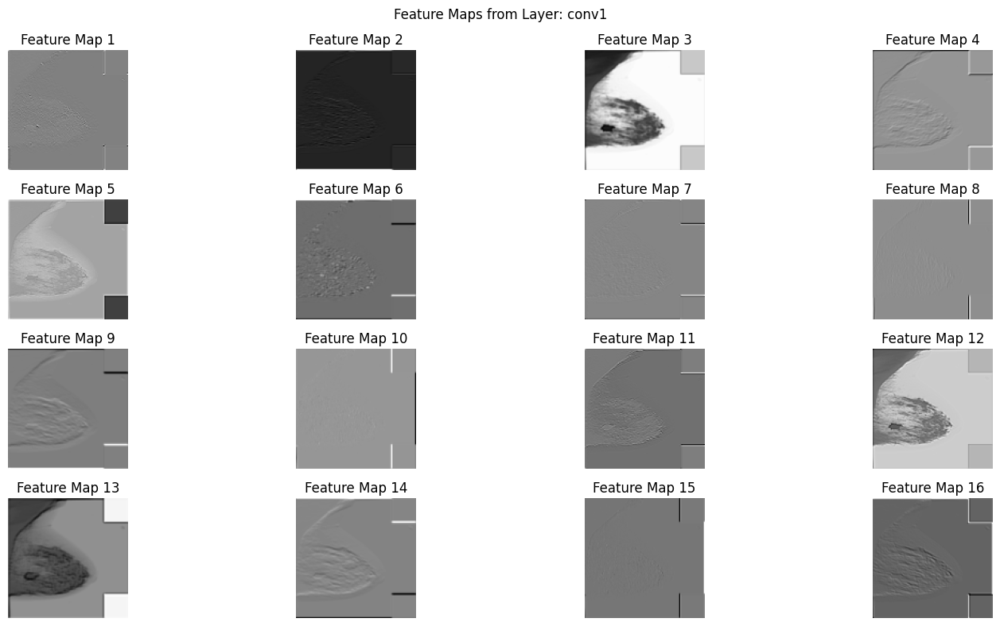

Visualizing Feature Maps for Layer: layer1.0.conv1, Shape: torch.Size([64, 56, 56])


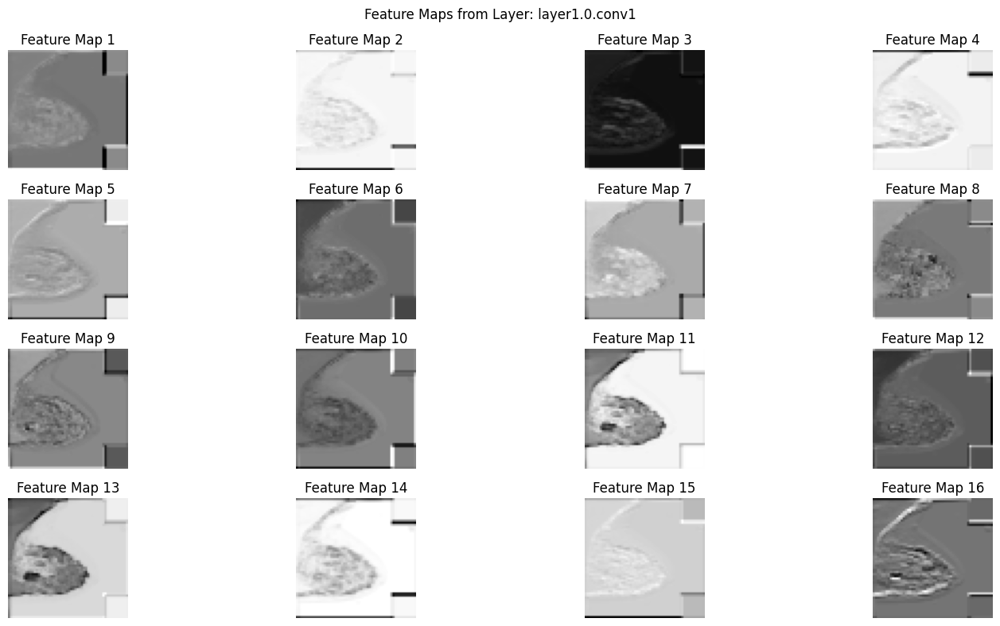

Visualizing Feature Maps for Layer: layer1.0.conv2, Shape: torch.Size([64, 56, 56])


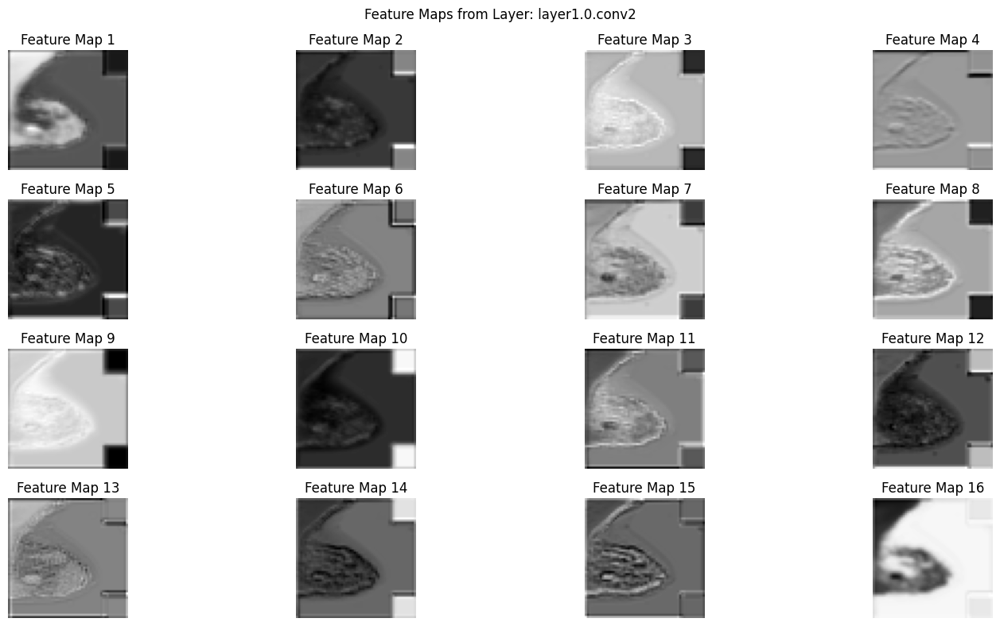

Visualizing Feature Maps for Layer: layer1.0.conv3, Shape: torch.Size([256, 56, 56])


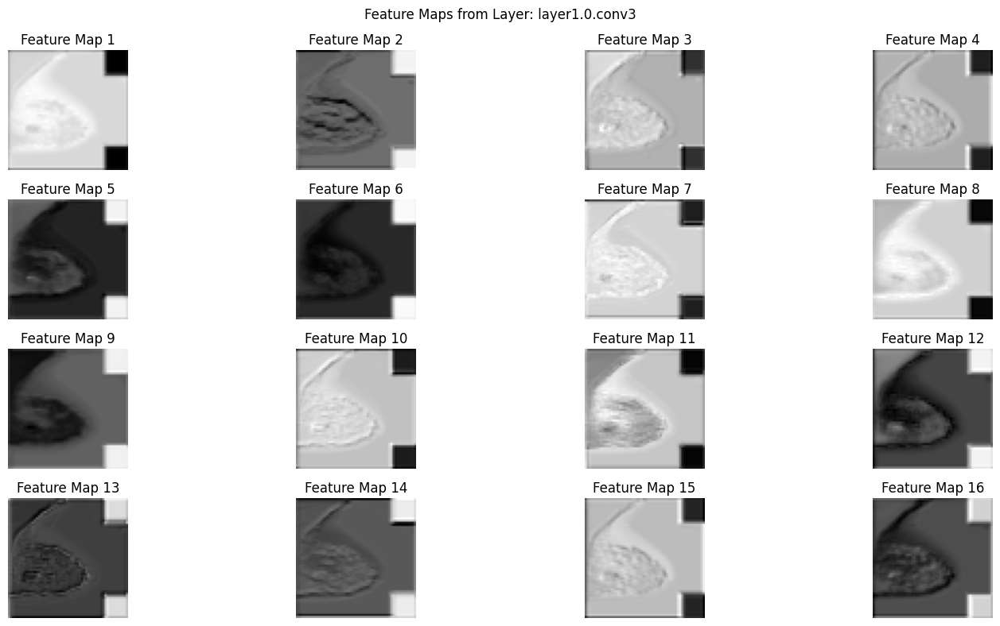

Visualizing Feature Maps for Layer: layer1.0.downsample.0, Shape: torch.Size([256, 56, 56])


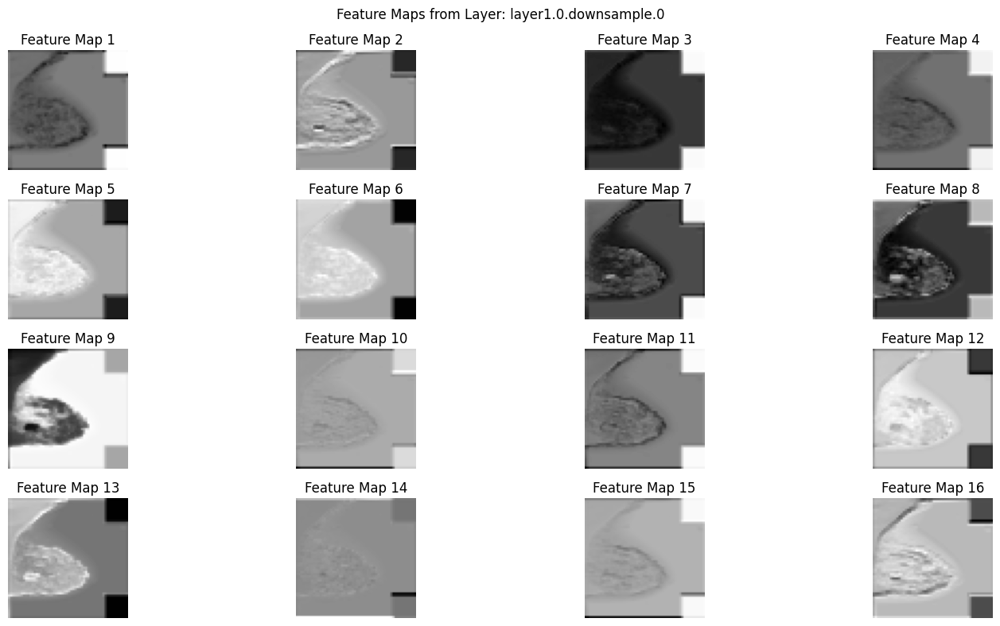

Visualizing Feature Maps for Layer: layer1.1.conv1, Shape: torch.Size([64, 56, 56])


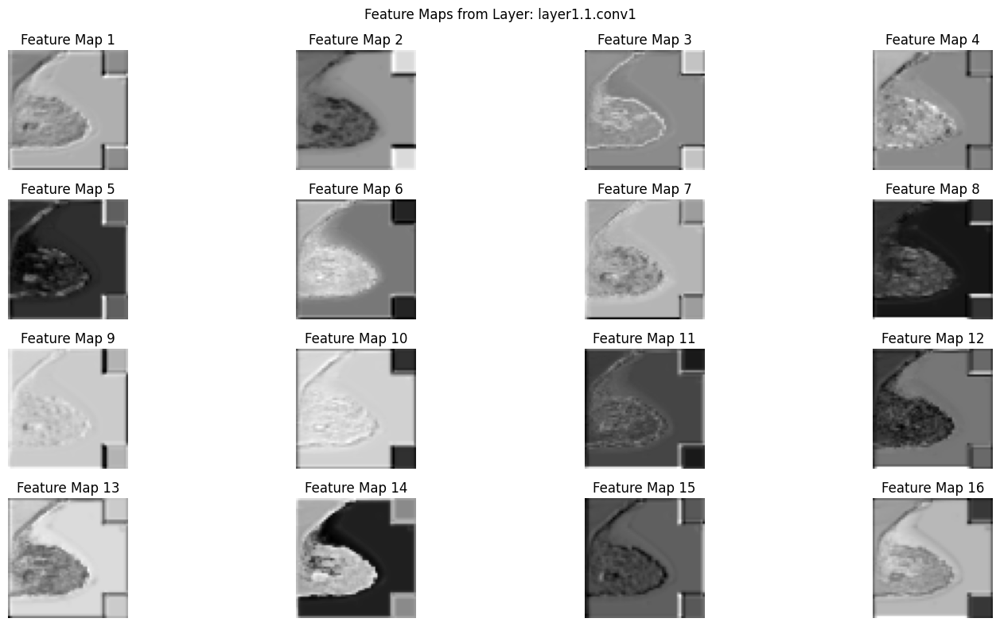

Visualizing Feature Maps for Layer: layer1.1.conv2, Shape: torch.Size([64, 56, 56])


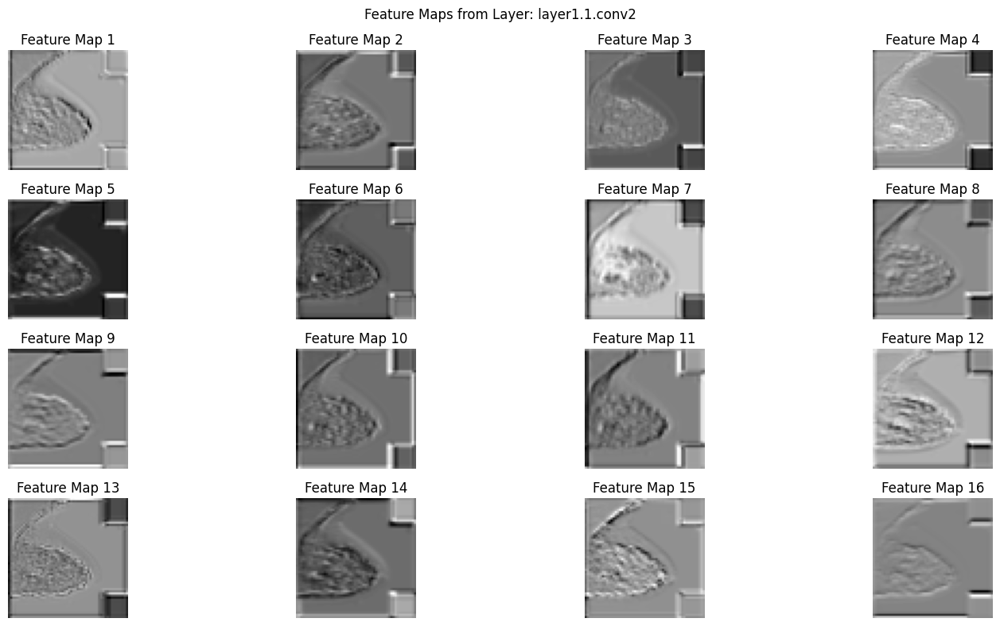

Visualizing Feature Maps for Layer: layer1.1.conv3, Shape: torch.Size([256, 56, 56])


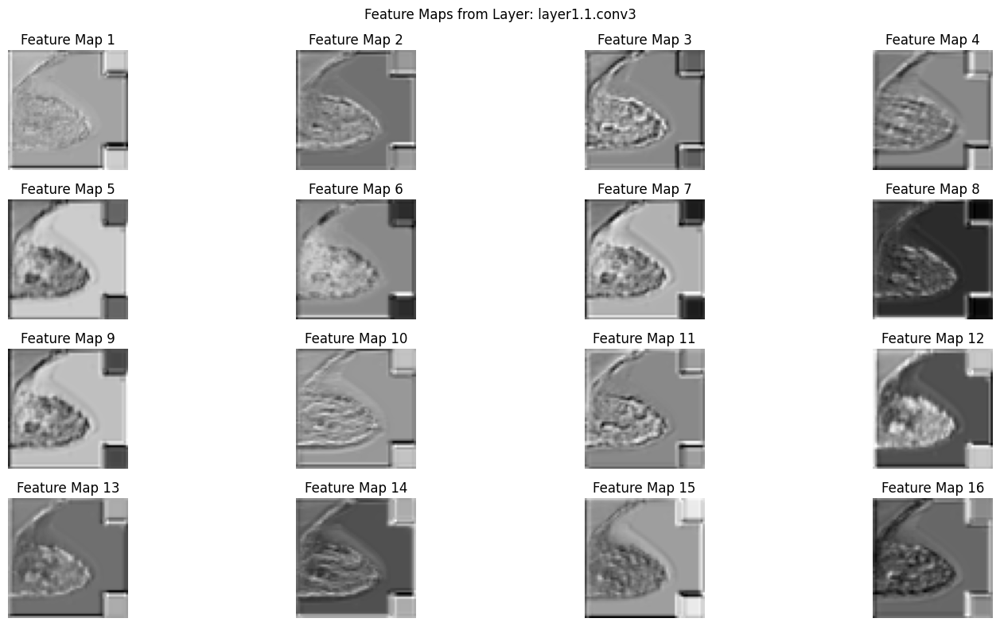

Visualizing Feature Maps for Layer: layer1.2.conv1, Shape: torch.Size([64, 56, 56])


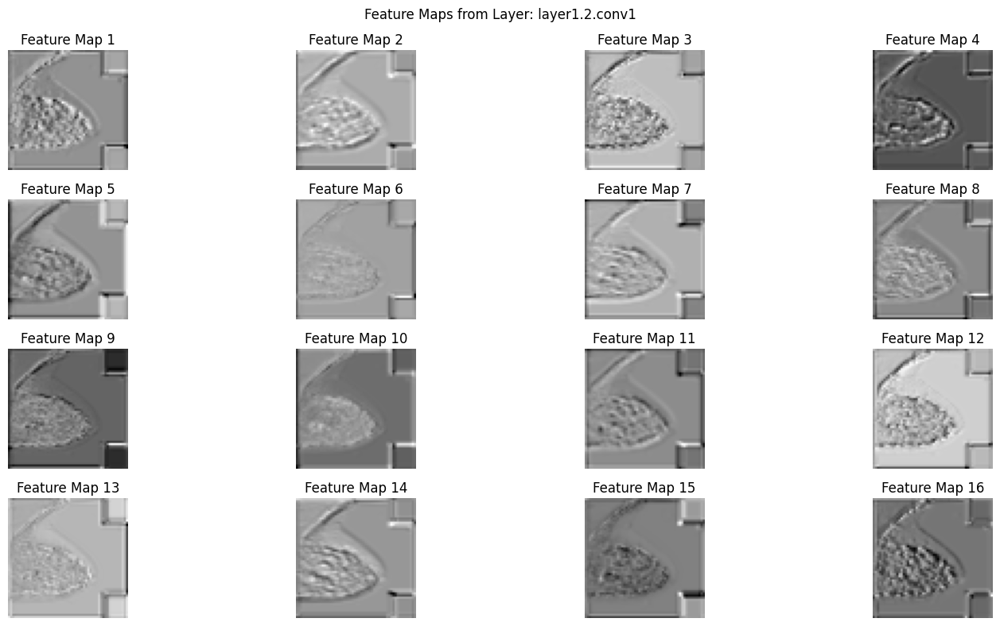

Visualizing Feature Maps for Layer: layer1.2.conv2, Shape: torch.Size([64, 56, 56])


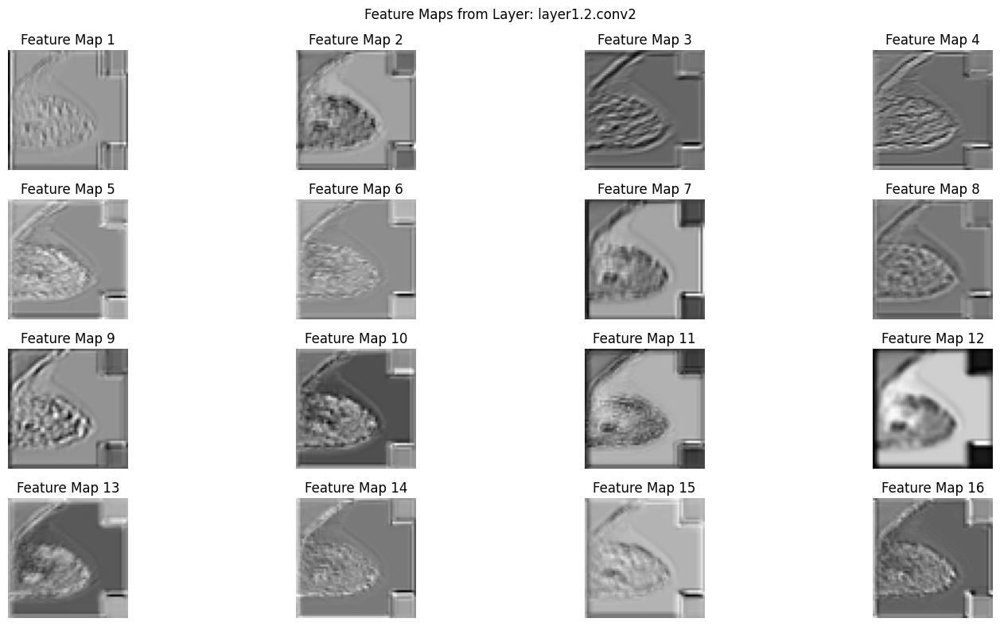

Visualizing Feature Maps for Layer: layer1.2.conv3, Shape: torch.Size([256, 56, 56])


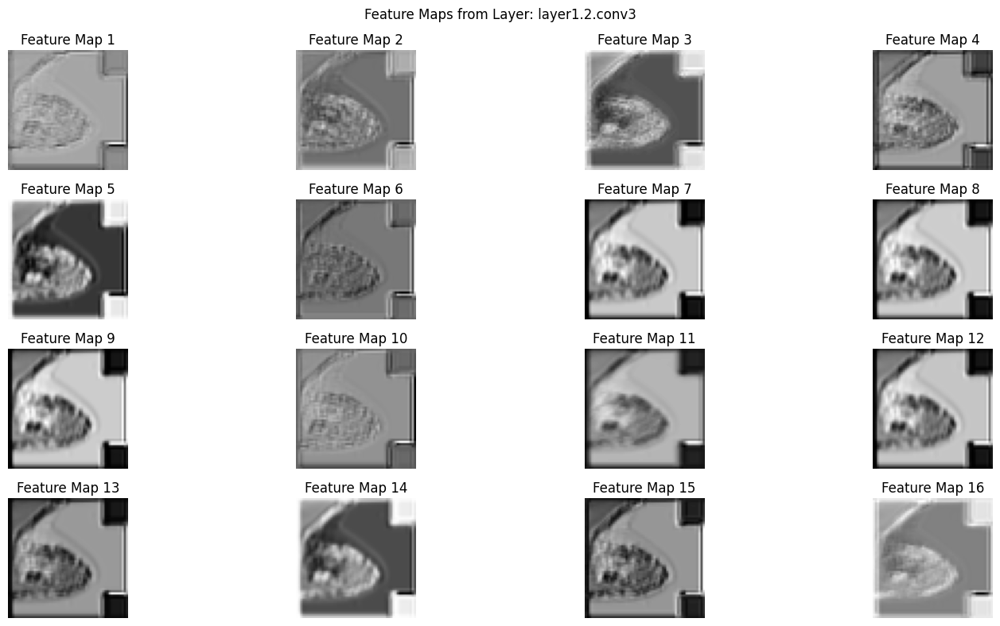

Visualizing Feature Maps for Layer: layer2.0.conv1, Shape: torch.Size([128, 56, 56])


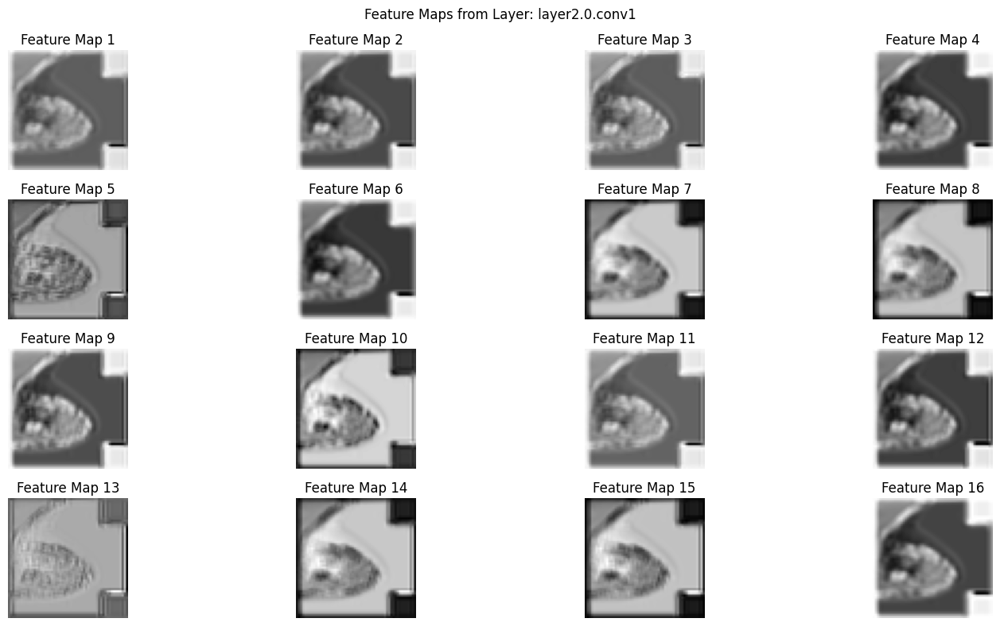

Visualizing Feature Maps for Layer: layer2.0.conv2, Shape: torch.Size([128, 28, 28])


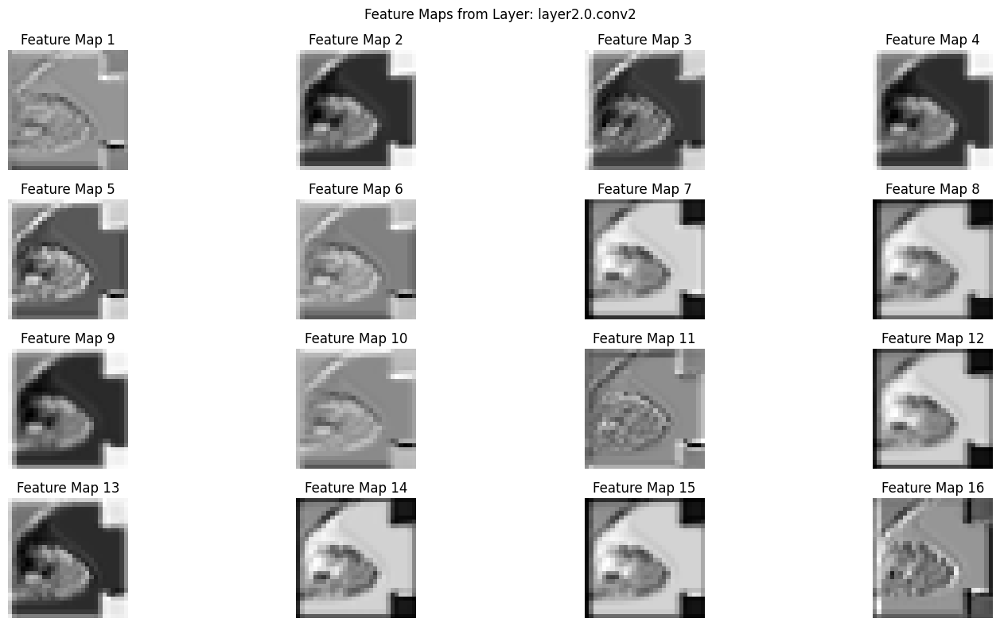

Visualizing Feature Maps for Layer: layer2.0.conv3, Shape: torch.Size([512, 28, 28])


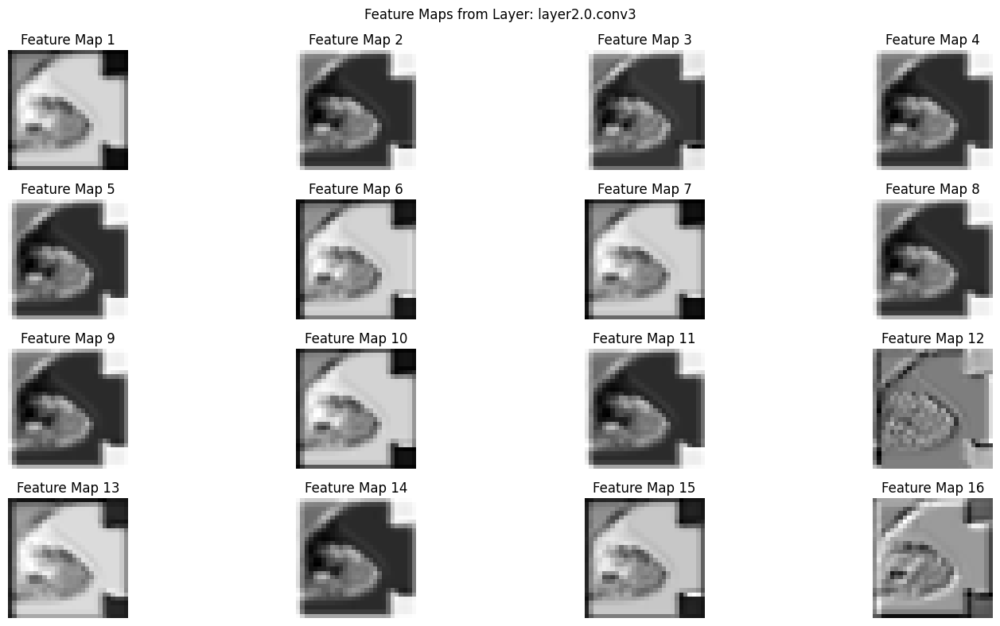

Visualizing Feature Maps for Layer: layer2.0.downsample.0, Shape: torch.Size([512, 28, 28])


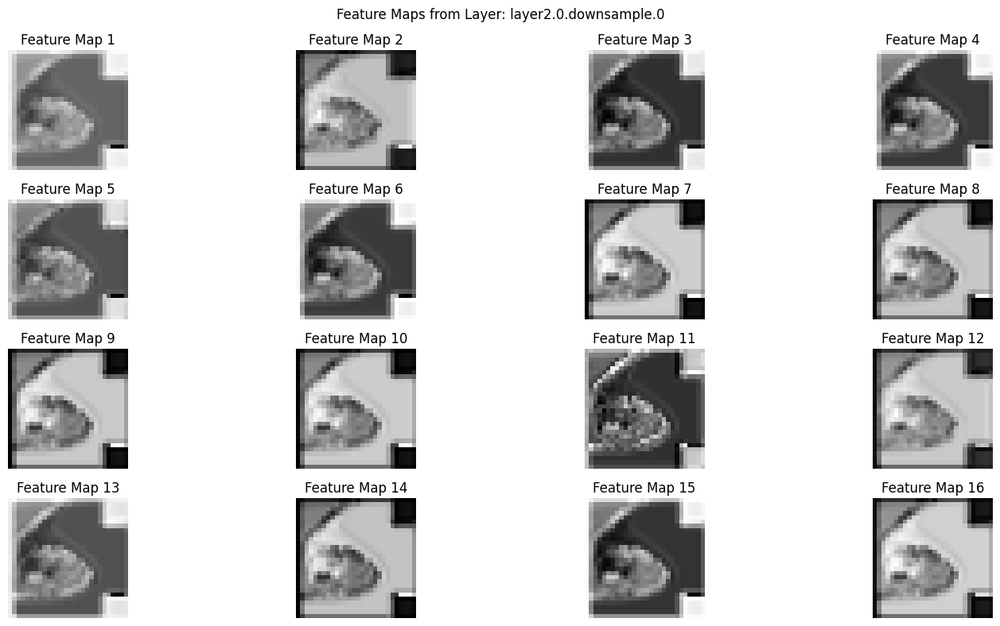

Visualizing Feature Maps for Layer: layer2.1.conv1, Shape: torch.Size([128, 28, 28])


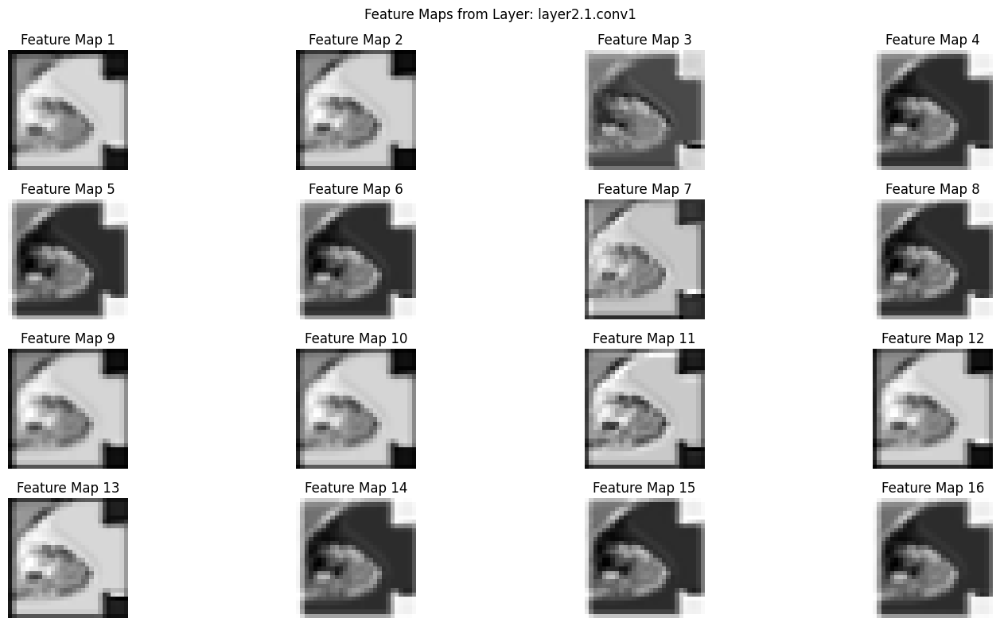

Visualizing Feature Maps for Layer: layer2.1.conv2, Shape: torch.Size([128, 28, 28])


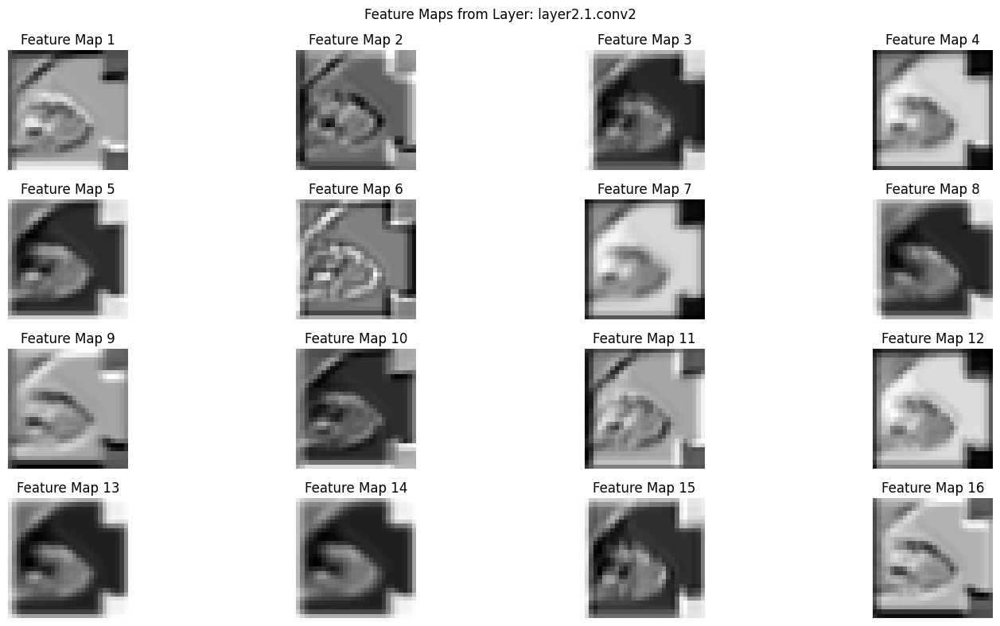

Visualizing Feature Maps for Layer: layer2.1.conv3, Shape: torch.Size([512, 28, 28])


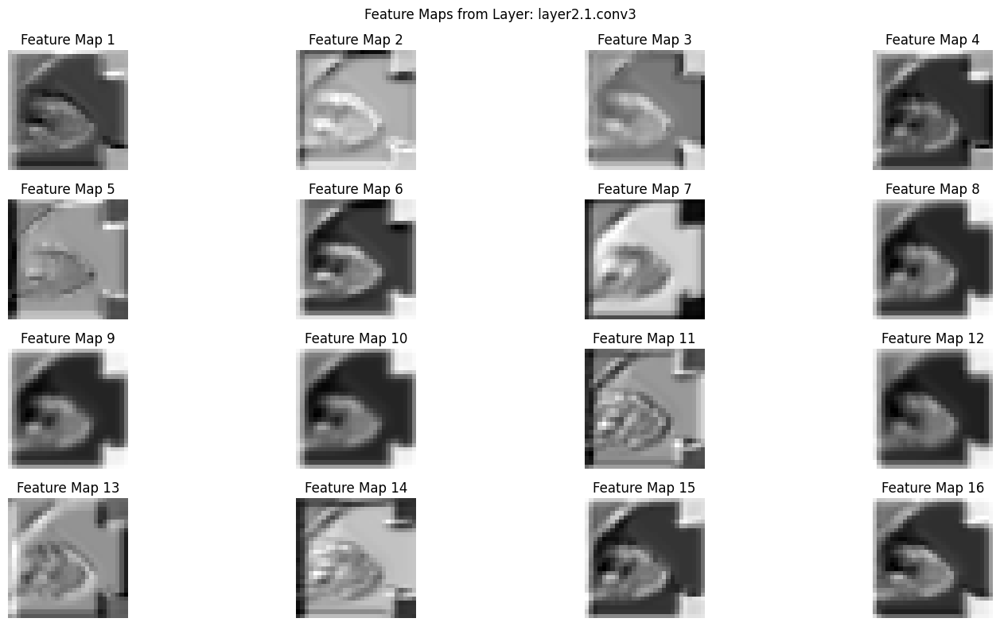

Visualizing Feature Maps for Layer: layer2.2.conv1, Shape: torch.Size([128, 28, 28])


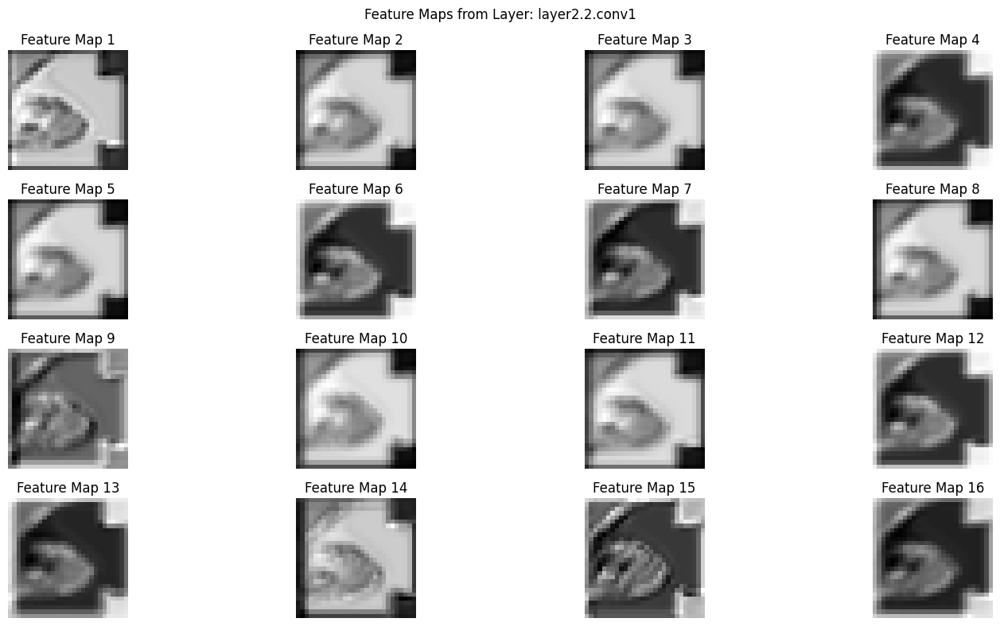

Visualizing Feature Maps for Layer: layer2.2.conv2, Shape: torch.Size([128, 28, 28])


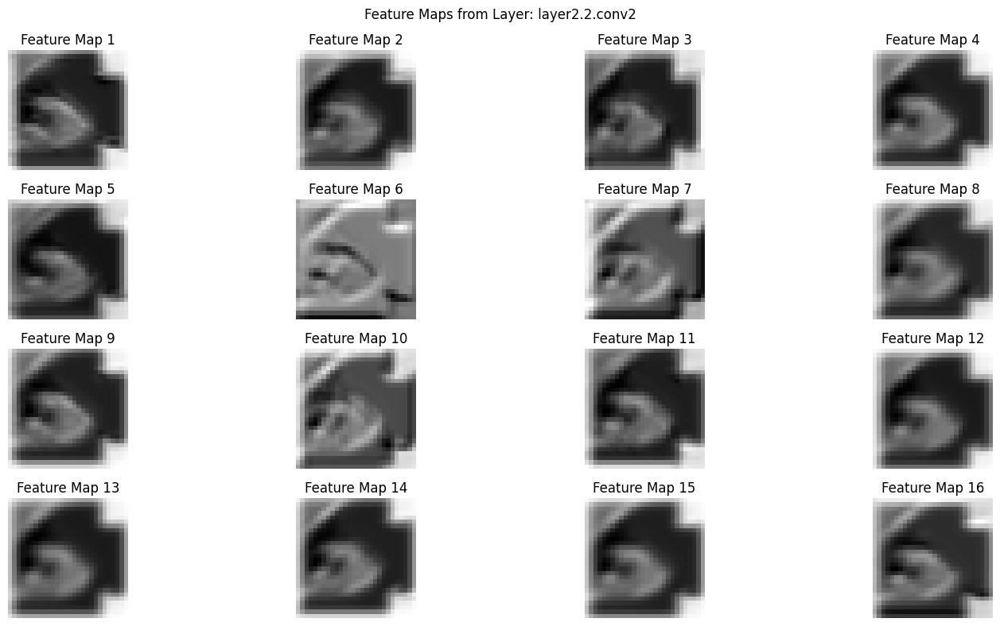

Visualizing Feature Maps for Layer: layer2.2.conv3, Shape: torch.Size([512, 28, 28])


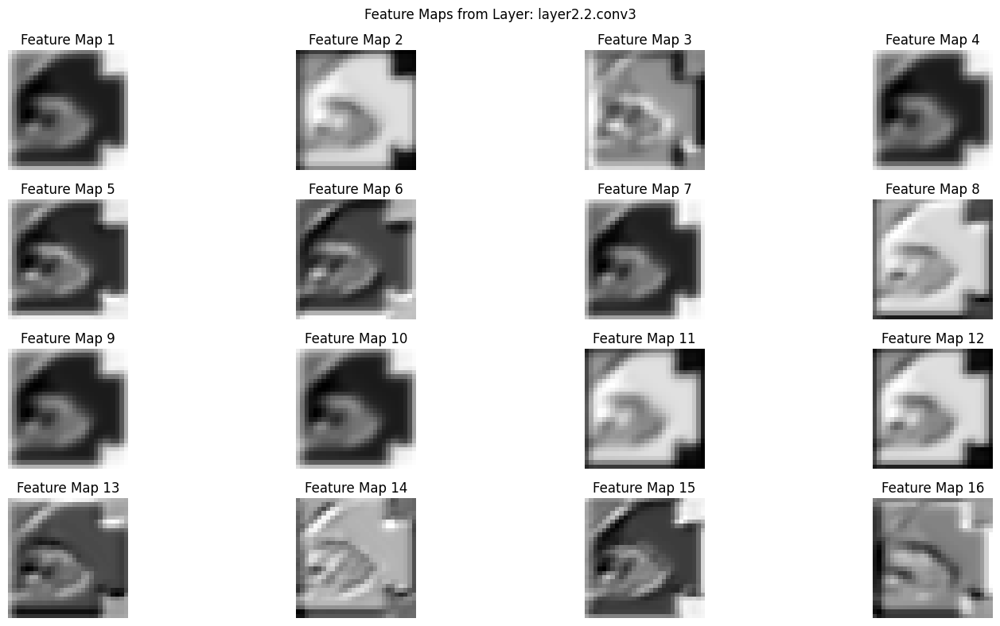

Visualizing Feature Maps for Layer: layer2.3.conv1, Shape: torch.Size([128, 28, 28])


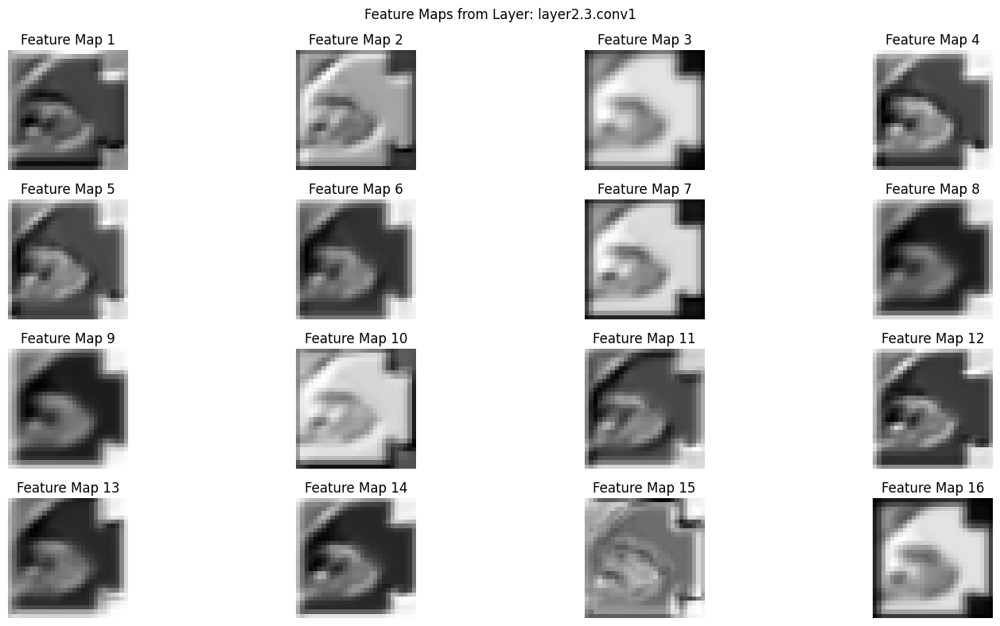

Visualizing Feature Maps for Layer: layer2.3.conv2, Shape: torch.Size([128, 28, 28])


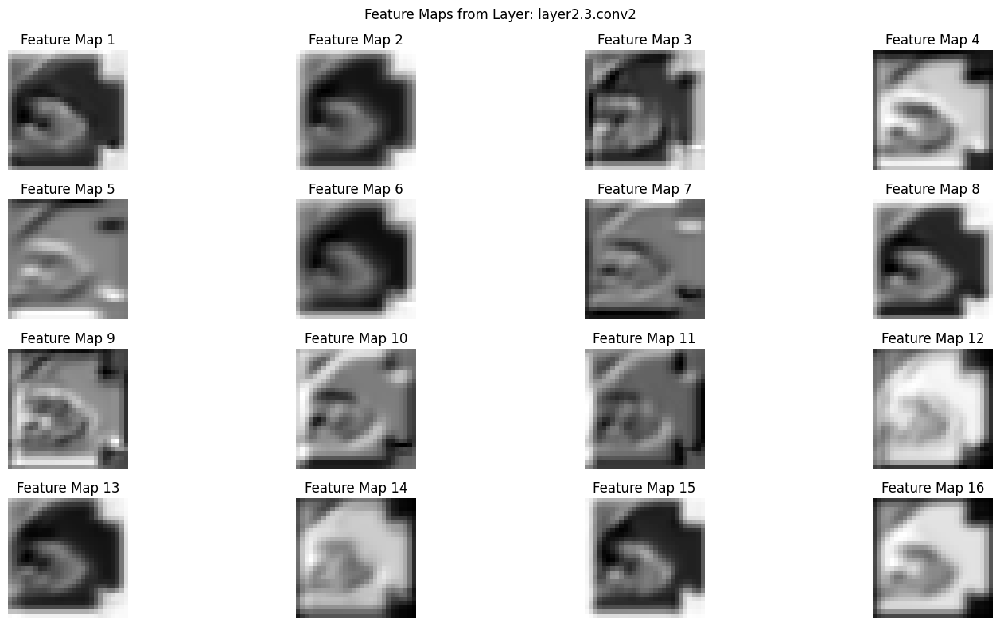

Visualizing Feature Maps for Layer: layer2.3.conv3, Shape: torch.Size([512, 28, 28])


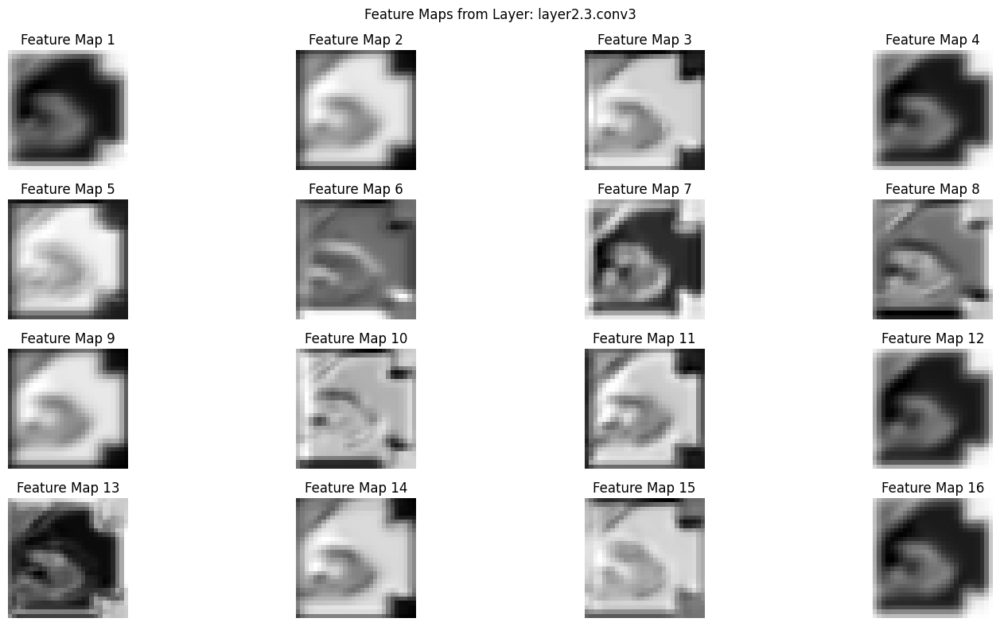

Visualizing Feature Maps for Layer: layer3.0.conv1, Shape: torch.Size([256, 28, 28])


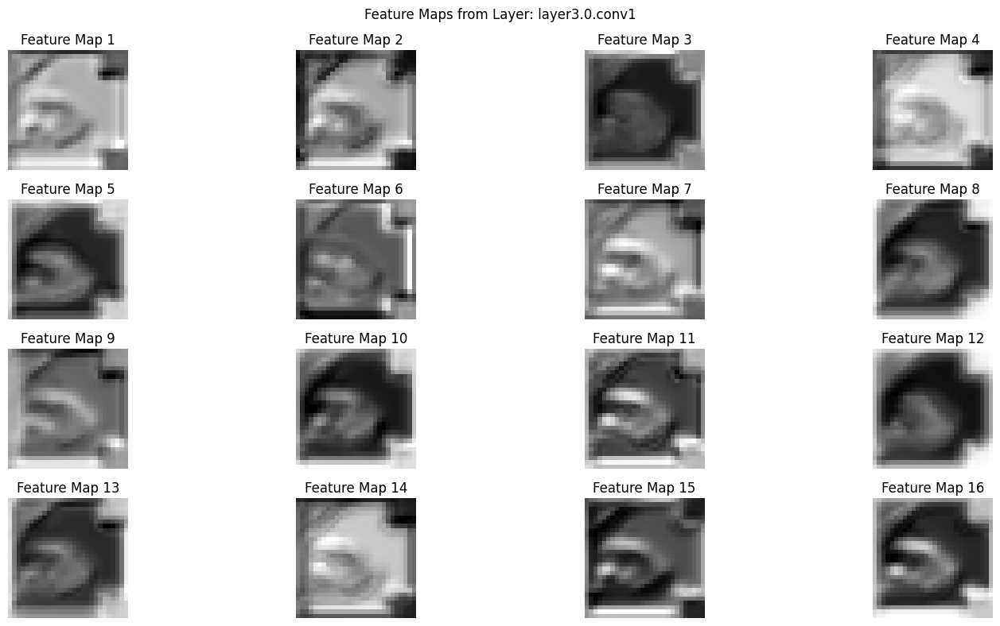

Visualizing Feature Maps for Layer: layer3.0.conv2, Shape: torch.Size([256, 14, 14])


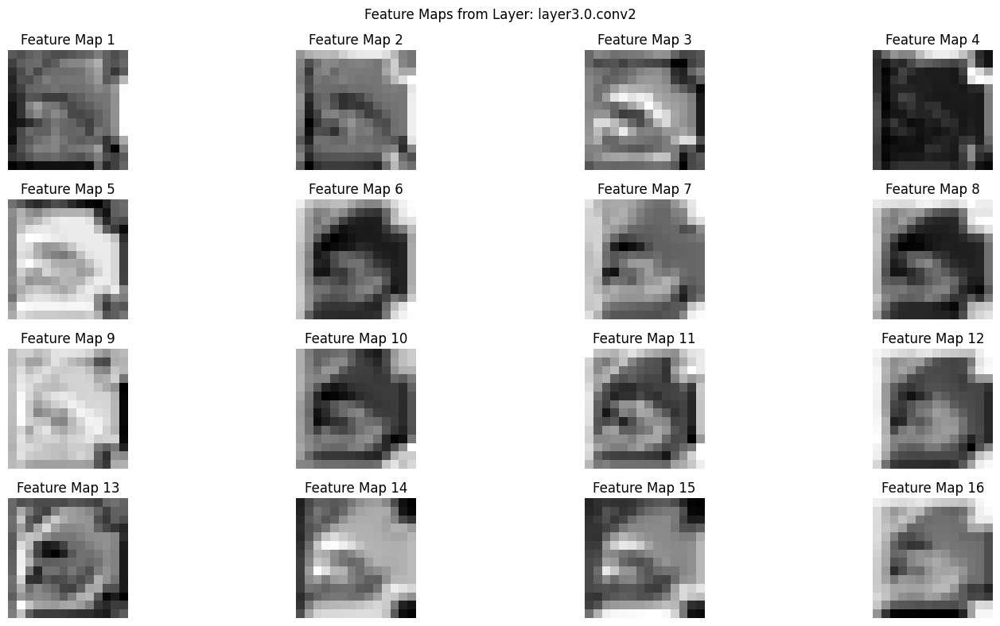

Visualizing Feature Maps for Layer: layer3.0.conv3, Shape: torch.Size([1024, 14, 14])


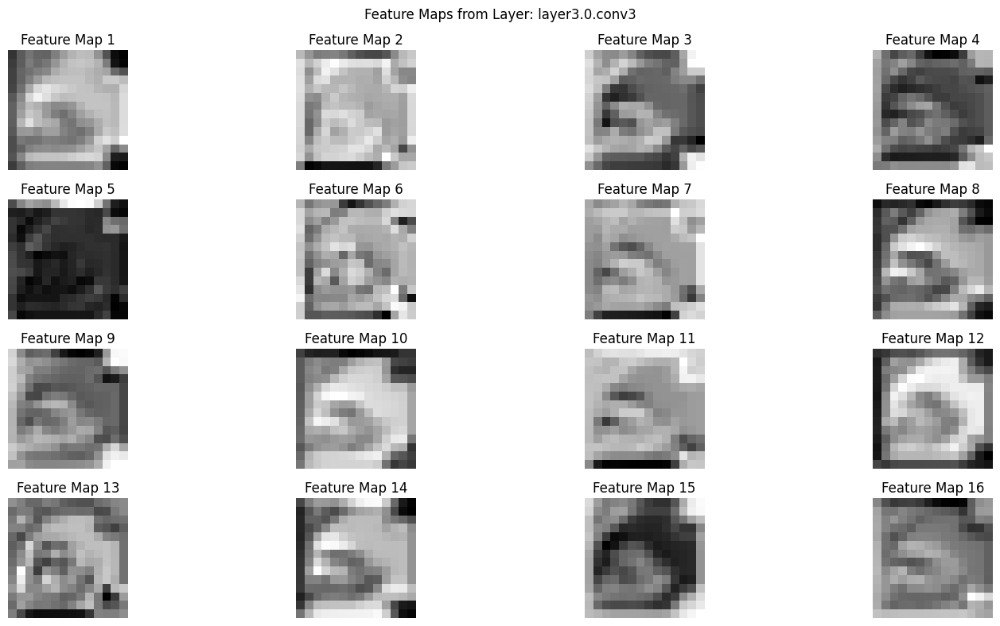

Visualizing Feature Maps for Layer: layer3.0.downsample.0, Shape: torch.Size([1024, 14, 14])


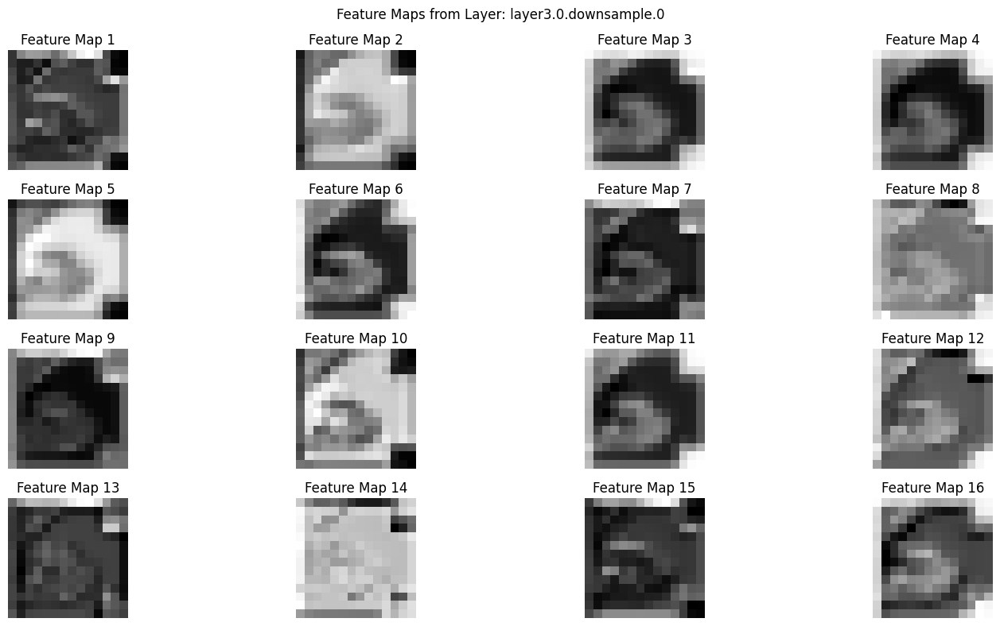

Visualizing Feature Maps for Layer: layer3.1.conv1, Shape: torch.Size([256, 14, 14])


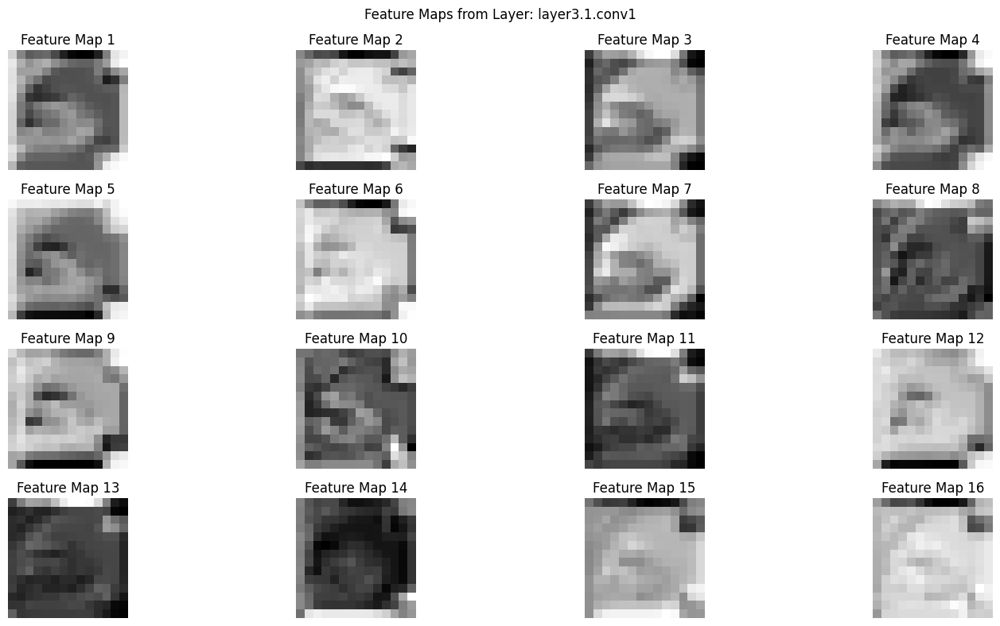

Visualizing Feature Maps for Layer: layer3.1.conv2, Shape: torch.Size([256, 14, 14])


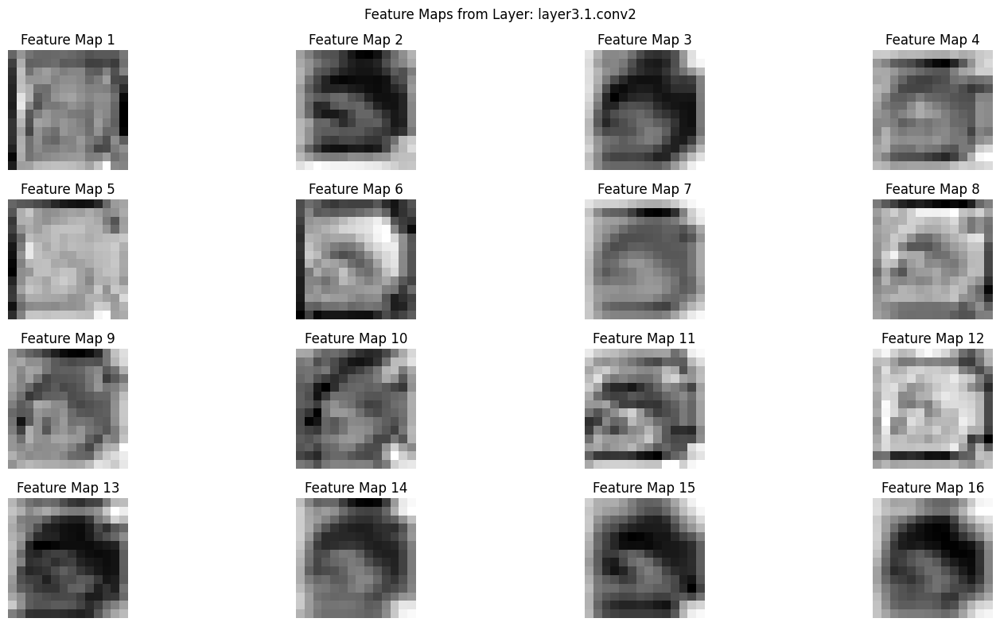

Visualizing Feature Maps for Layer: layer3.1.conv3, Shape: torch.Size([1024, 14, 14])


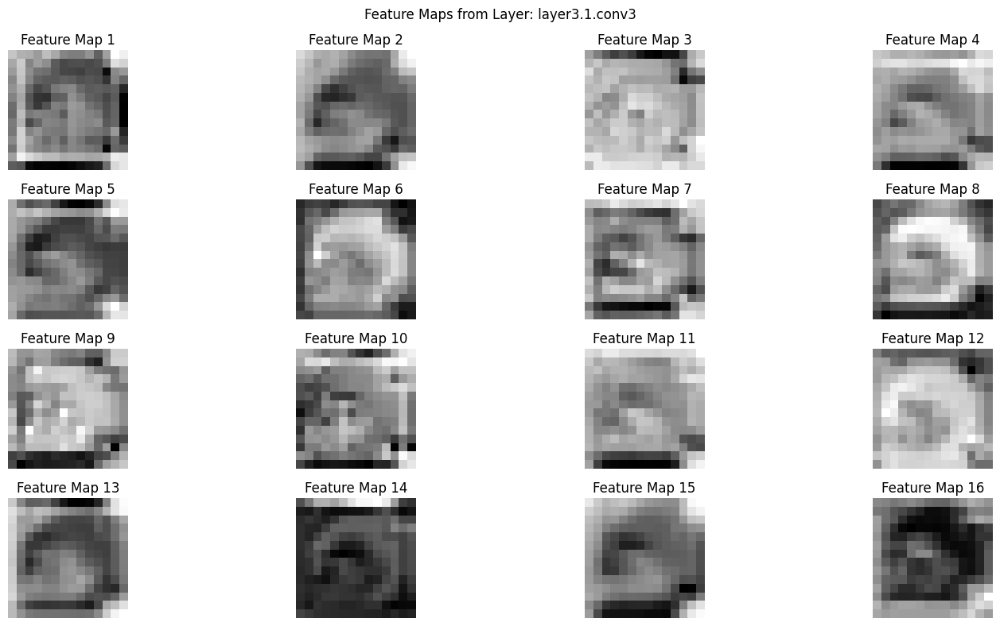

Visualizing Feature Maps for Layer: layer3.2.conv1, Shape: torch.Size([256, 14, 14])


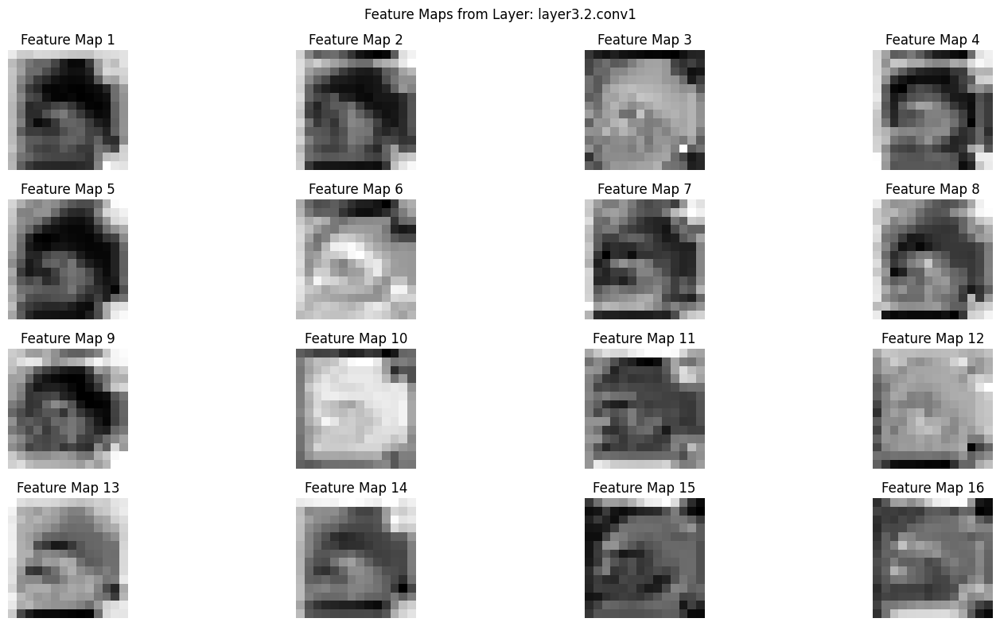

Visualizing Feature Maps for Layer: layer3.2.conv2, Shape: torch.Size([256, 14, 14])


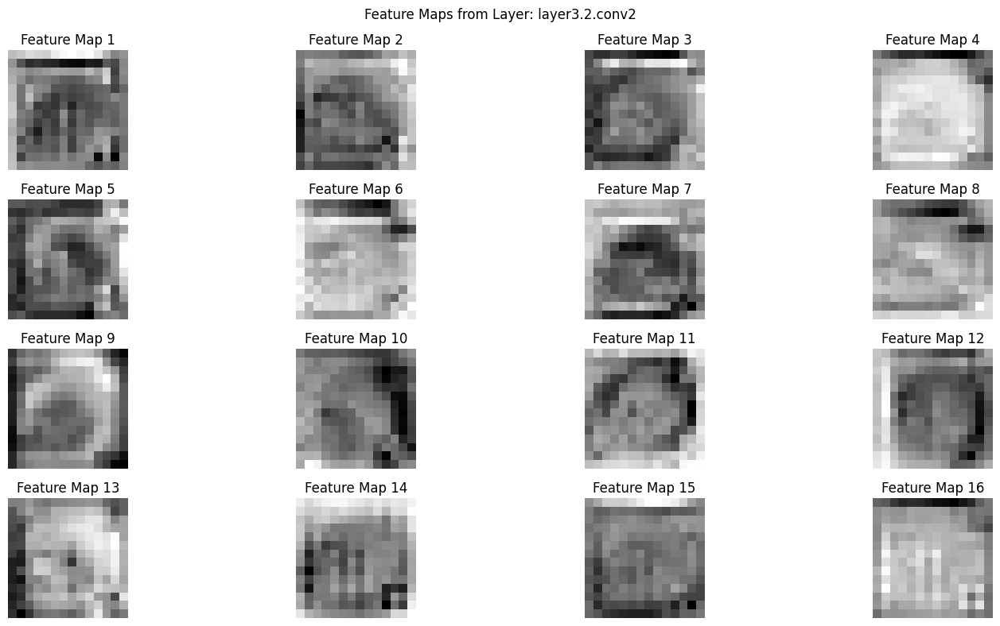

Visualizing Feature Maps for Layer: layer3.2.conv3, Shape: torch.Size([1024, 14, 14])


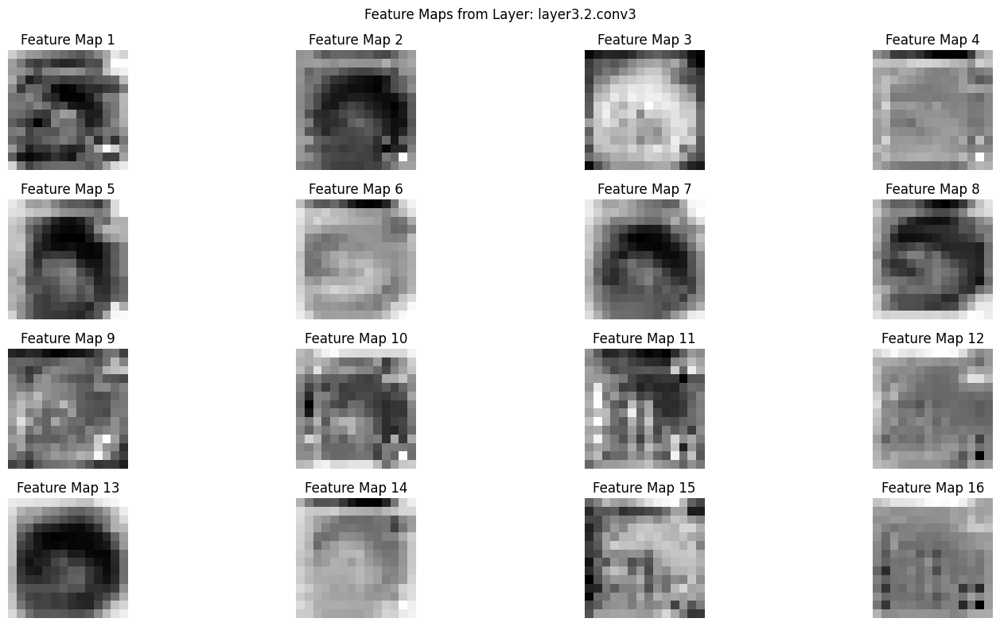

Visualizing Feature Maps for Layer: layer3.3.conv1, Shape: torch.Size([256, 14, 14])


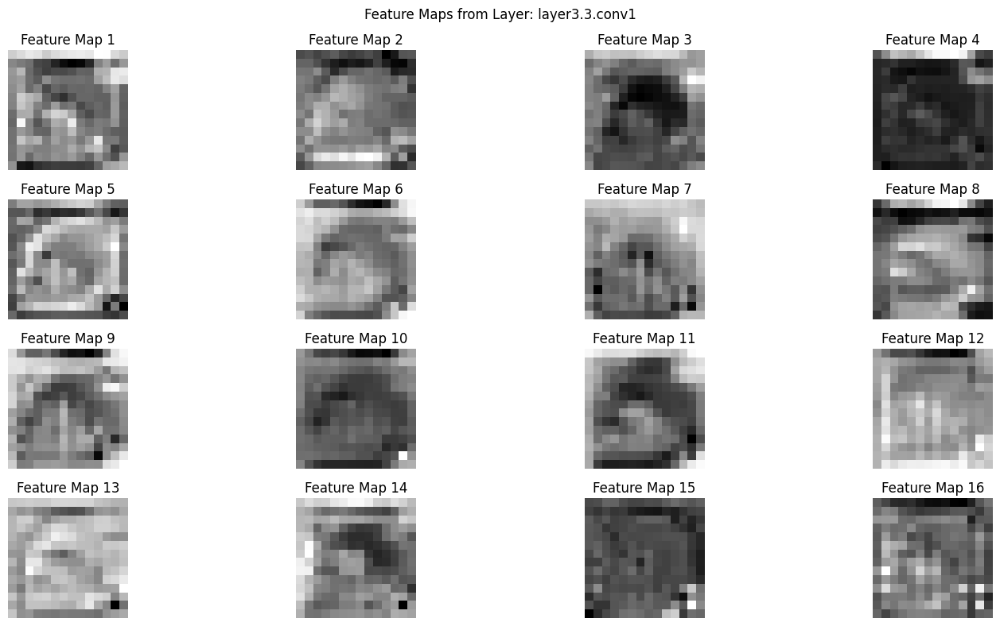

Visualizing Feature Maps for Layer: layer3.3.conv2, Shape: torch.Size([256, 14, 14])


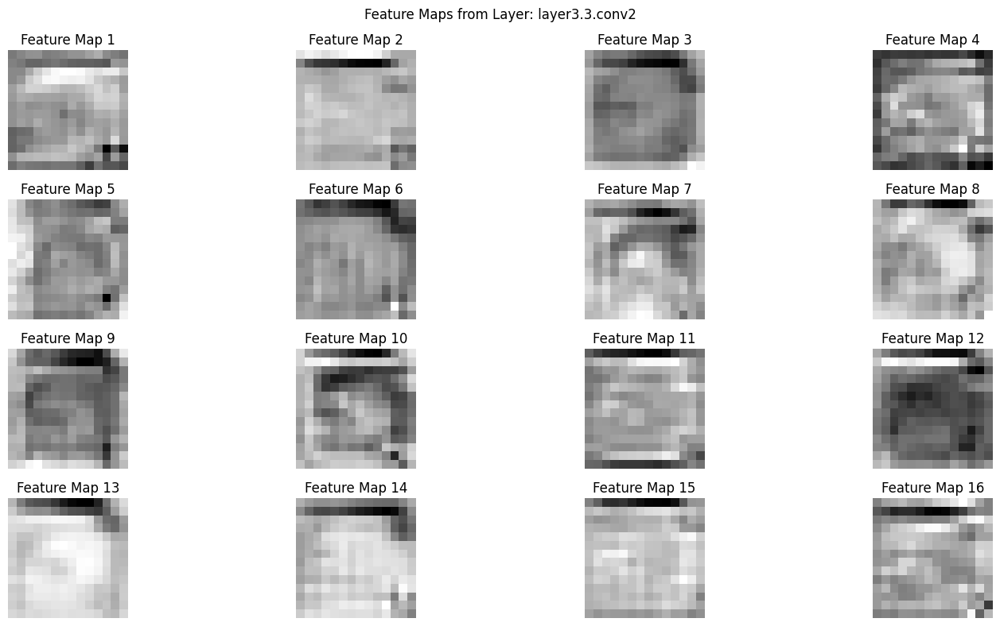

Visualizing Feature Maps for Layer: layer3.3.conv3, Shape: torch.Size([1024, 14, 14])


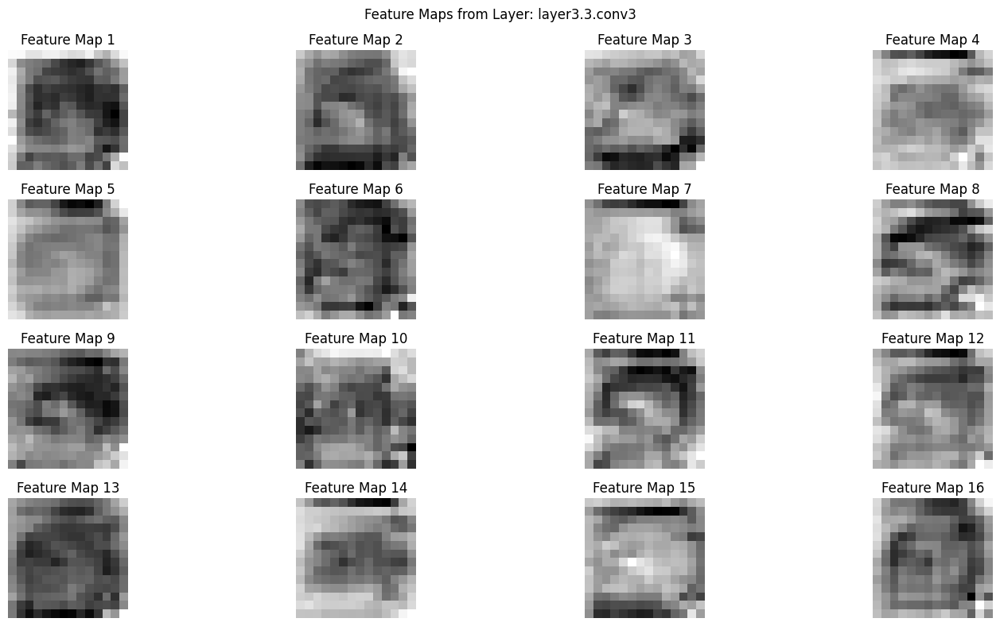

Visualizing Feature Maps for Layer: layer3.4.conv1, Shape: torch.Size([256, 14, 14])


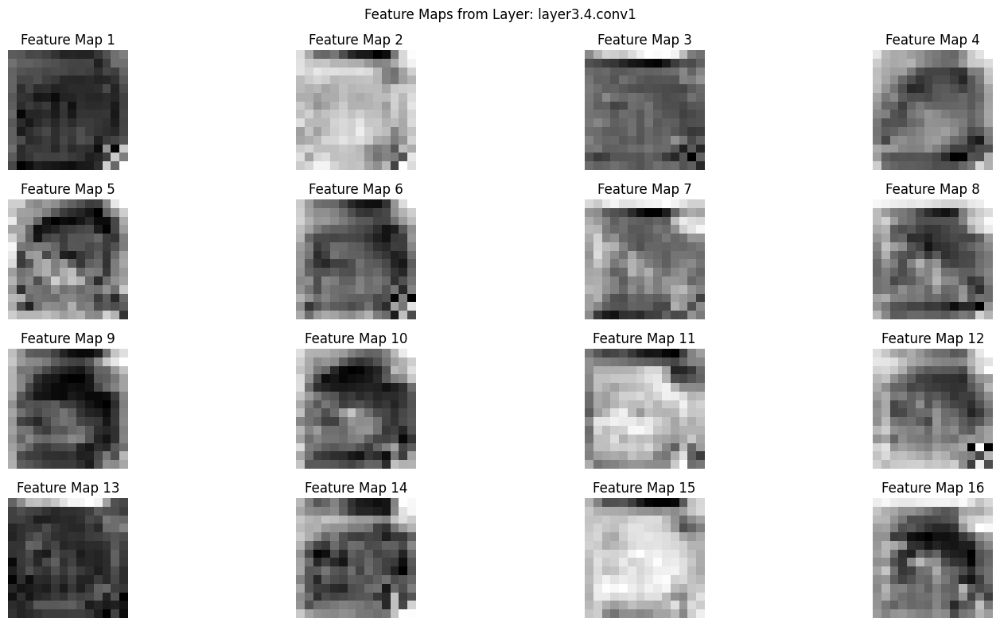

Visualizing Feature Maps for Layer: layer3.4.conv2, Shape: torch.Size([256, 14, 14])


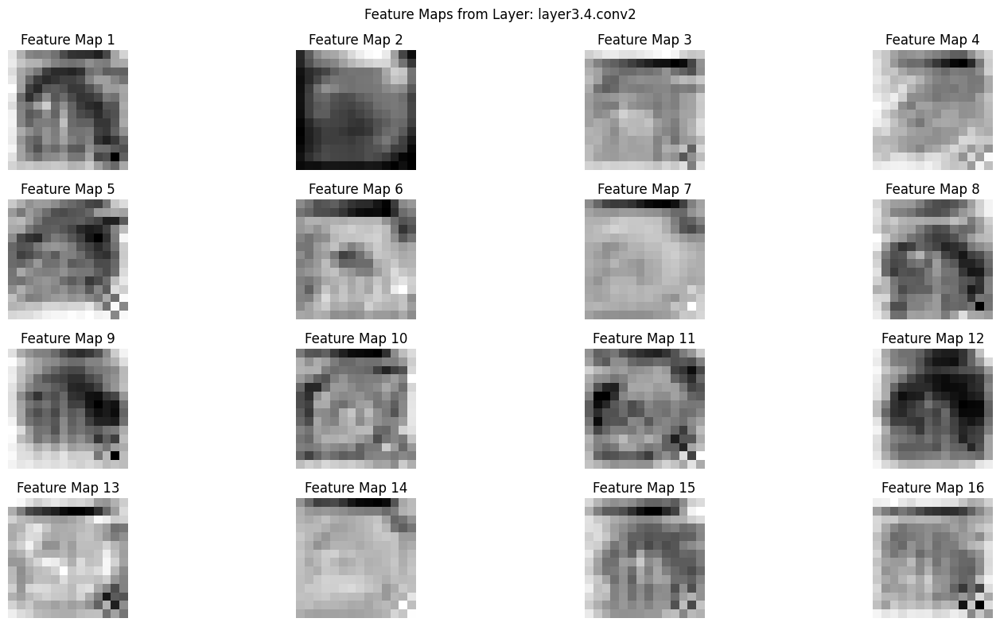

Visualizing Feature Maps for Layer: layer3.4.conv3, Shape: torch.Size([1024, 14, 14])


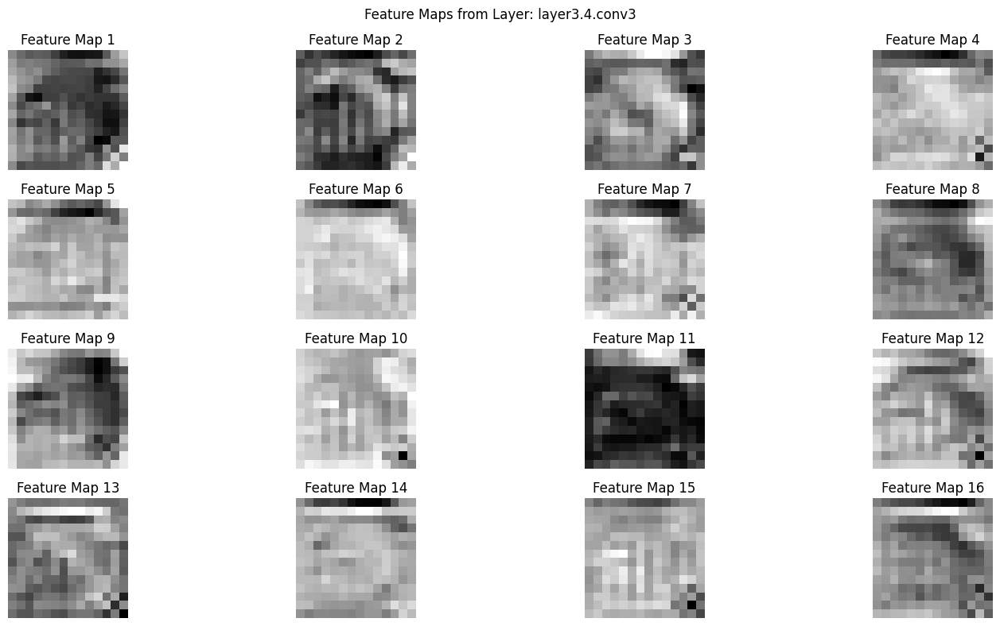

Visualizing Feature Maps for Layer: layer3.5.conv1, Shape: torch.Size([256, 14, 14])


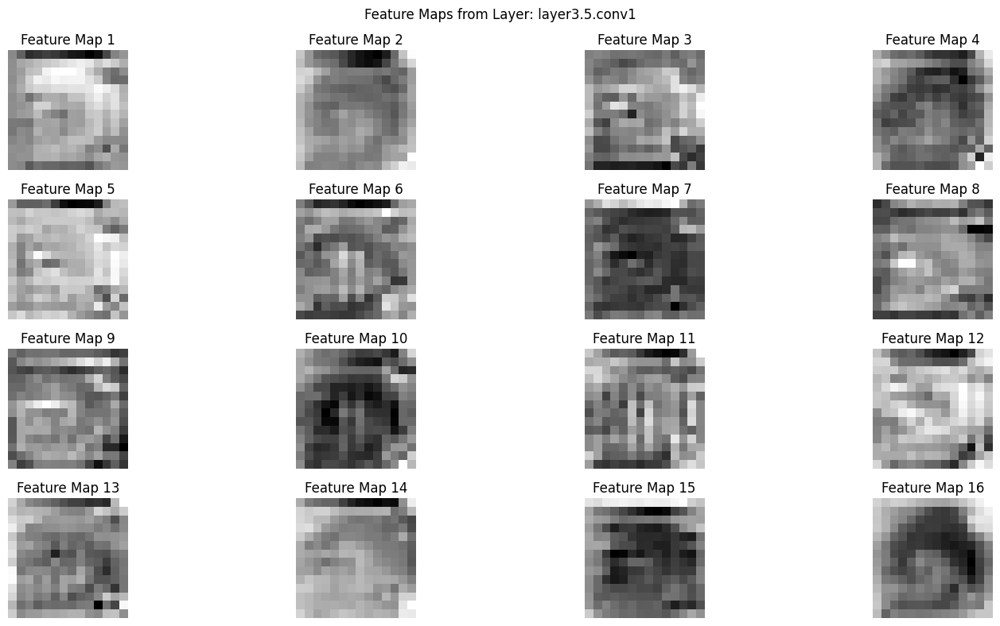

Visualizing Feature Maps for Layer: layer3.5.conv2, Shape: torch.Size([256, 14, 14])


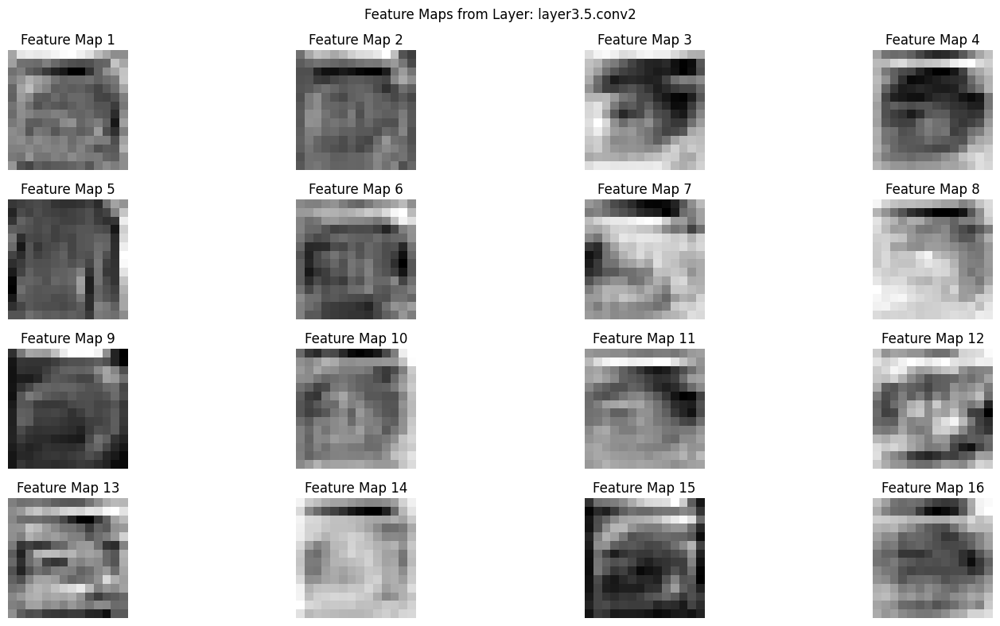

Visualizing Feature Maps for Layer: layer3.5.conv3, Shape: torch.Size([1024, 14, 14])


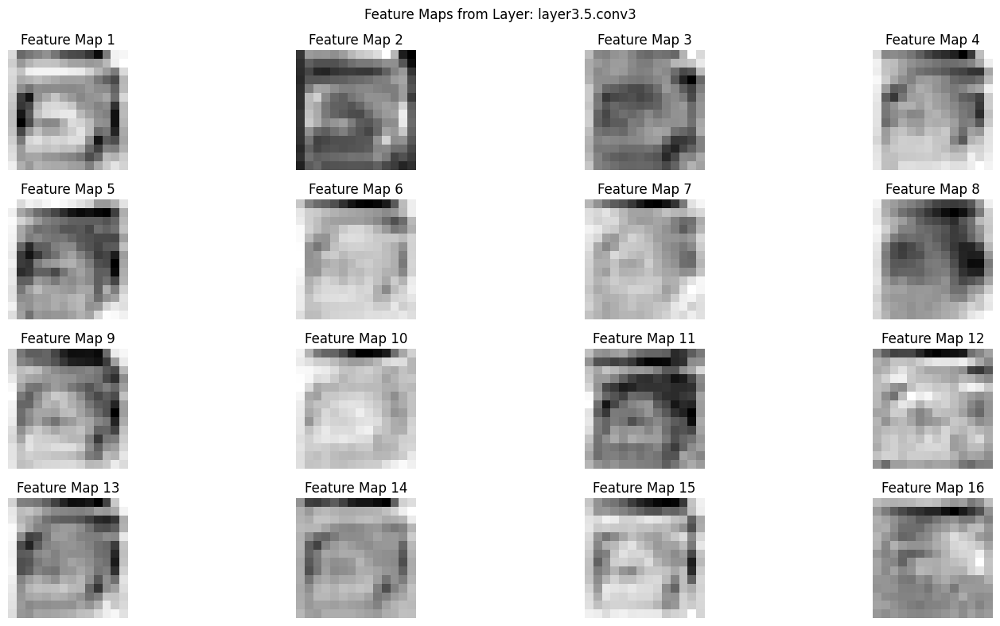

Visualizing Feature Maps for Layer: layer4.0.conv1, Shape: torch.Size([512, 14, 14])


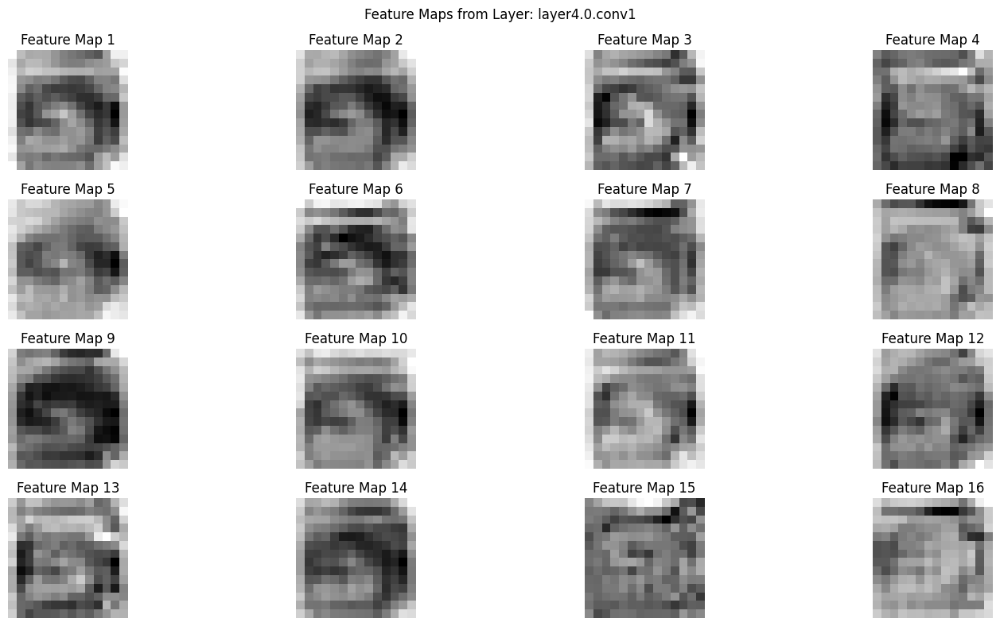

Visualizing Feature Maps for Layer: layer4.0.conv2, Shape: torch.Size([512, 7, 7])


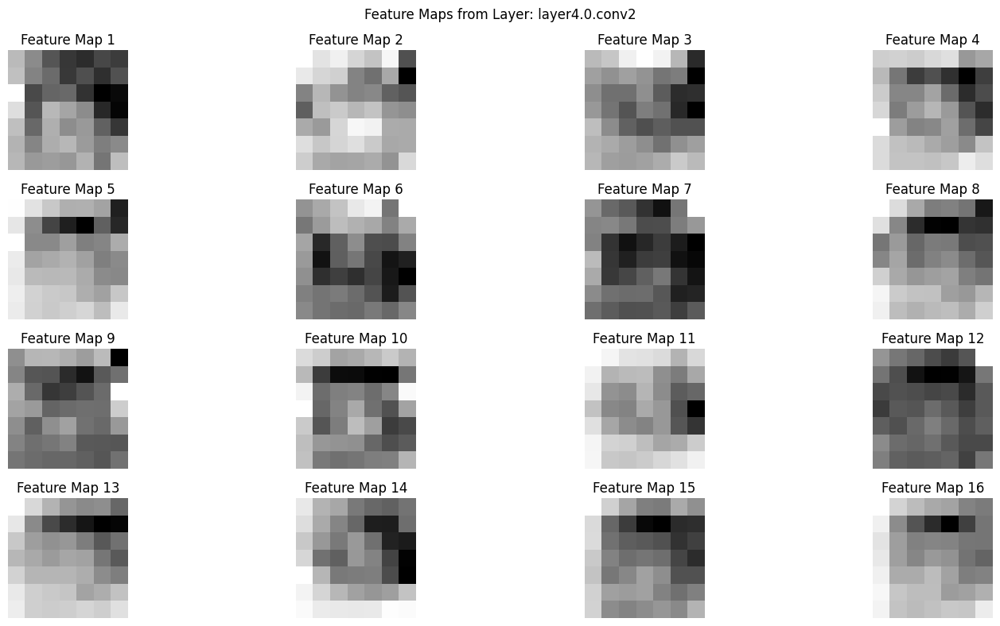

Visualizing Feature Maps for Layer: layer4.0.conv3, Shape: torch.Size([2048, 7, 7])


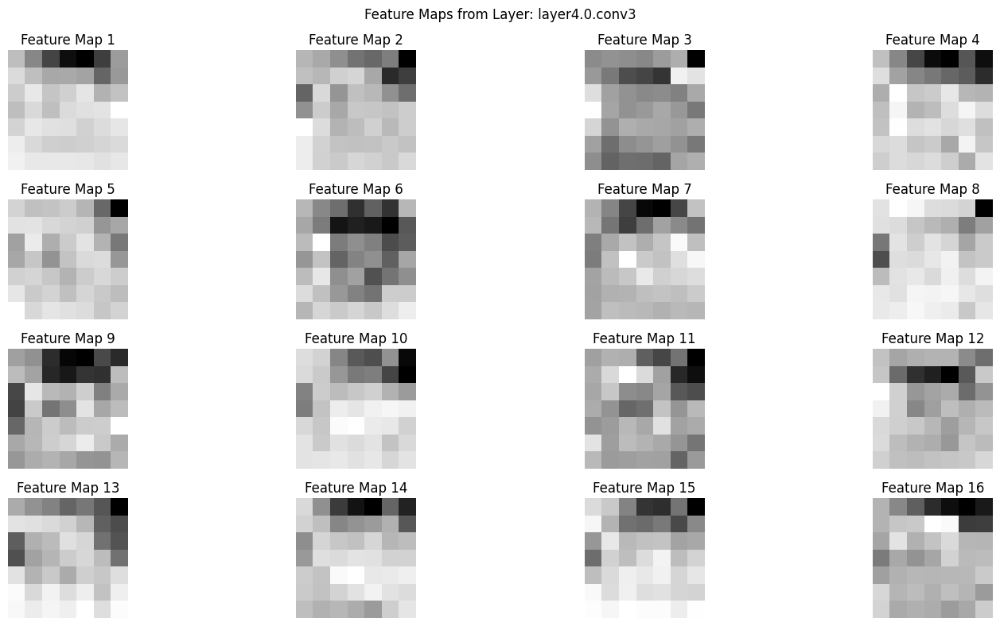

Visualizing Feature Maps for Layer: layer4.0.downsample.0, Shape: torch.Size([2048, 7, 7])


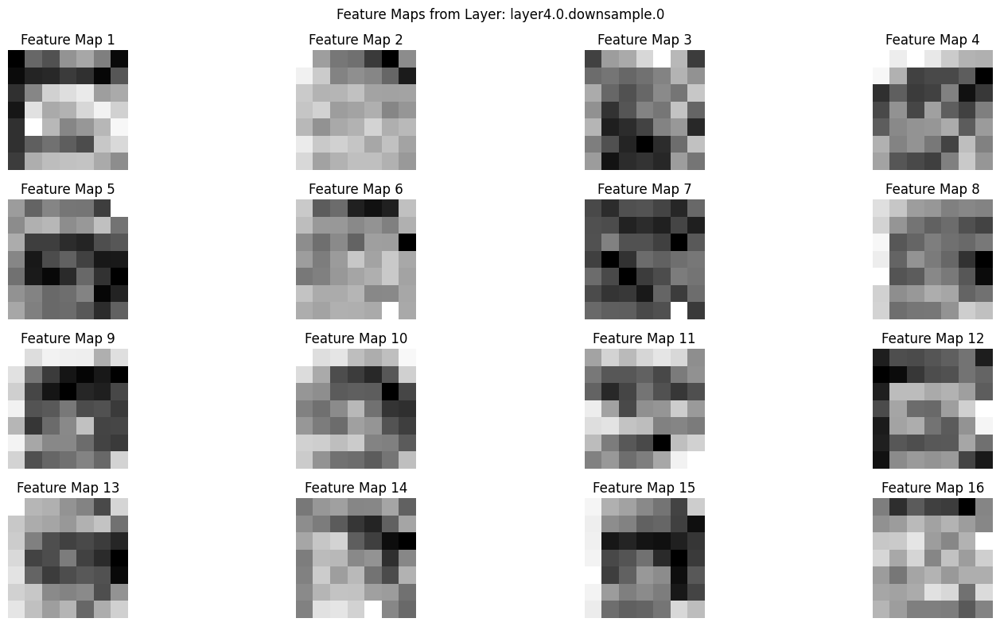

Visualizing Feature Maps for Layer: layer4.1.conv1, Shape: torch.Size([512, 7, 7])


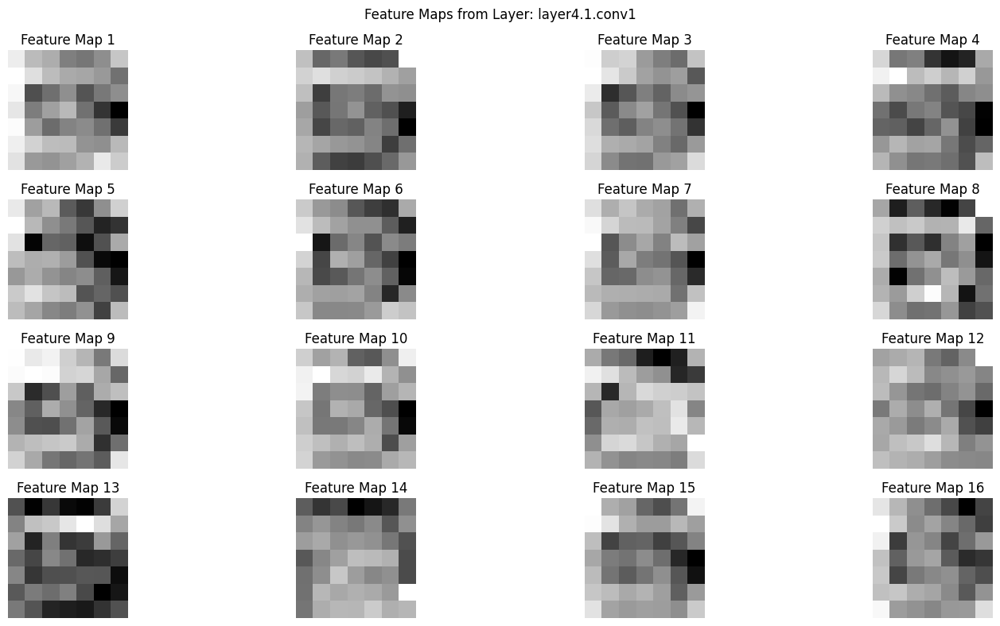

Visualizing Feature Maps for Layer: layer4.1.conv2, Shape: torch.Size([512, 7, 7])


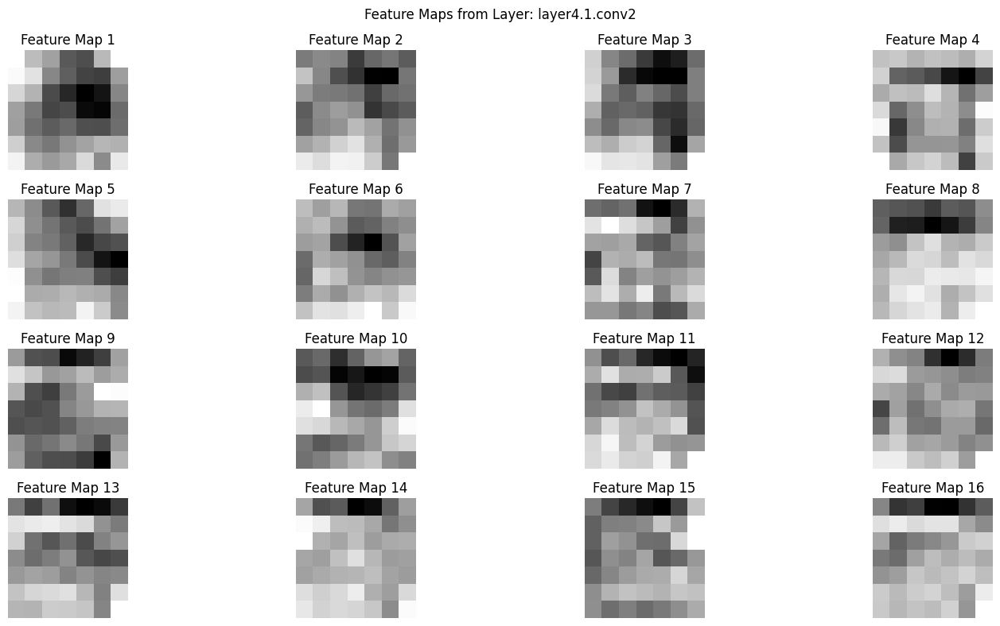

Visualizing Feature Maps for Layer: layer4.1.conv3, Shape: torch.Size([2048, 7, 7])


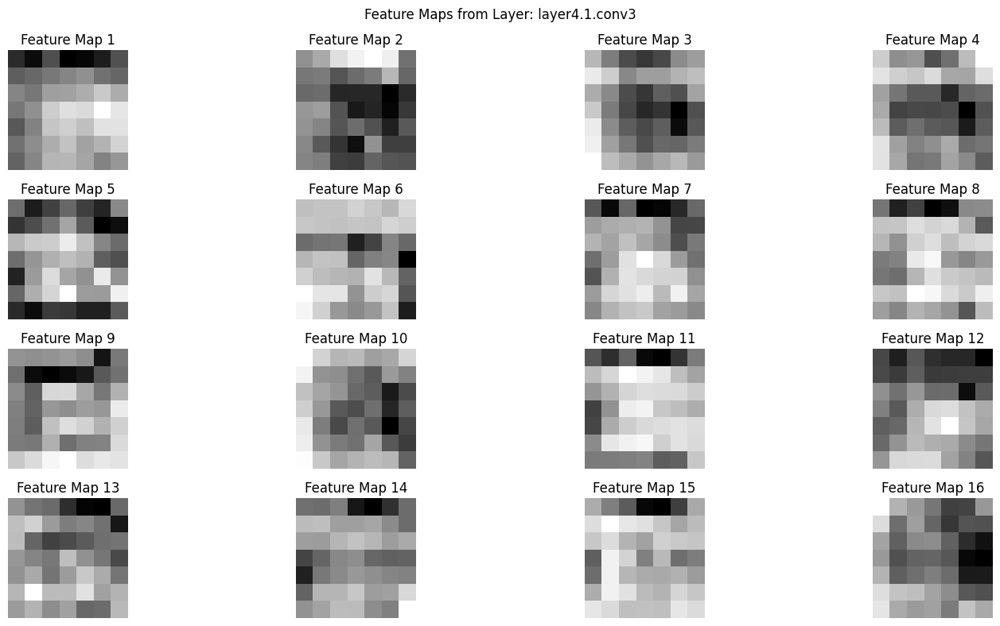

Visualizing Feature Maps for Layer: layer4.2.conv1, Shape: torch.Size([512, 7, 7])


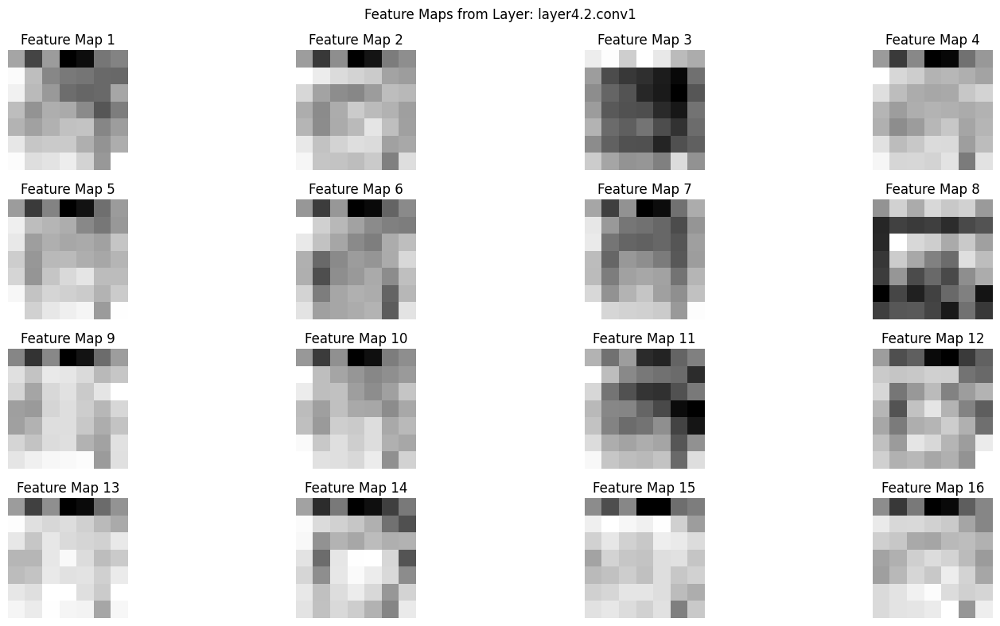

Visualizing Feature Maps for Layer: layer4.2.conv2, Shape: torch.Size([512, 7, 7])


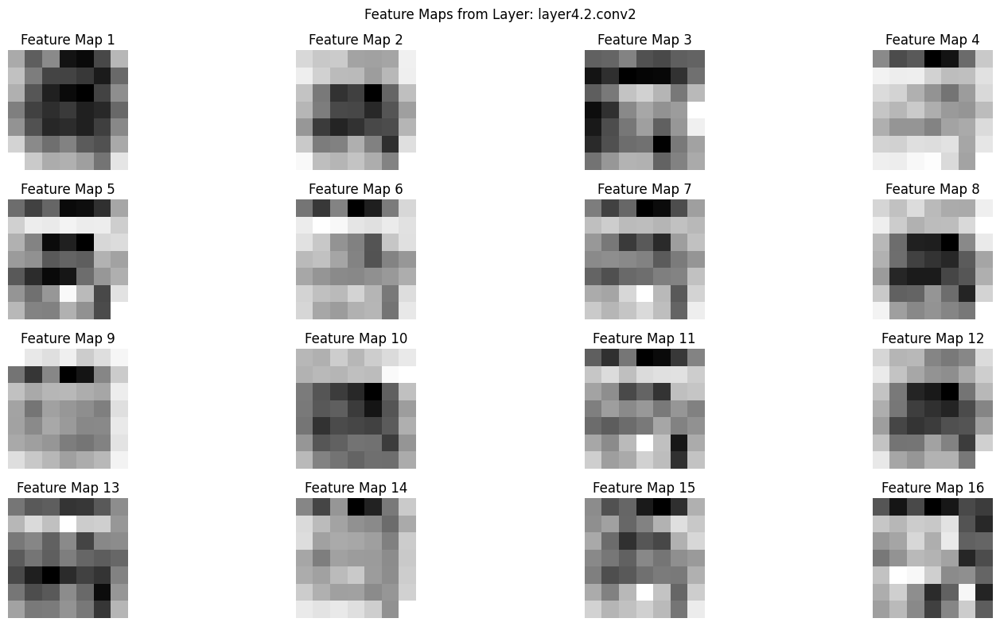

Visualizing Feature Maps for Layer: layer4.2.conv3, Shape: torch.Size([2048, 7, 7])


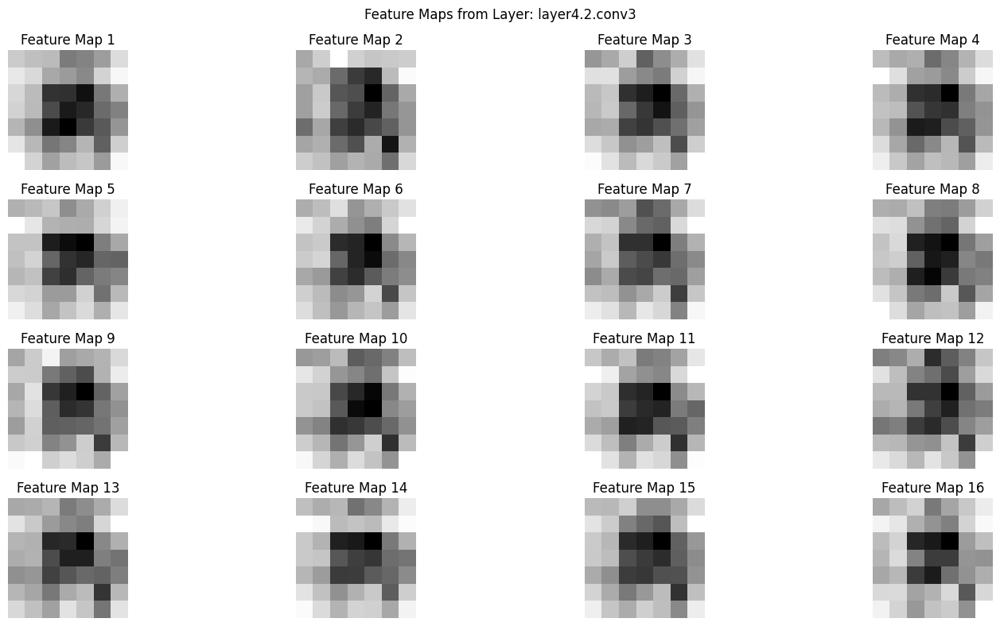

In [54]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# Function to visualize feature maps layer-by-layer
def visualize_feature_maps_all_layers(model, npy_path):
    model.eval()
    activations = {}

    # Hook to capture activations for all layers
    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook

    # Register hooks for all convolutional and linear layers
    hooks = []
    for name, layer in model.named_modules():
        if isinstance(layer, torch.nn.Conv2d) or isinstance(layer, torch.nn.Linear):
            hooks.append(layer.register_forward_hook(get_activation(name)))

    # 1. Load and preprocess the .npy image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    npy_image_tensor = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize the image
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image_tensor).unsqueeze(0).to(device)  # Add batch dimension
    
    # Plot Original Image
    npy_image_display = npy_image_tensor.permute(1, 2, 0).numpy()  # Back to (H, W, 3)
    npy_image_display = (npy_image_display - npy_image_display.min()) / (npy_image_display.max() - npy_image_display.min())
    
    plt.figure(figsize=(6, 6))
    plt.imshow(npy_image_display)
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

    # 2. Forward pass to generate activations
    with torch.no_grad():
        _ = model(input_tensor)

    # 3. Visualize feature maps layer-by-layer
    for name, activation in activations.items():
        activation = activation.cpu().squeeze()  # Remove batch dimension
        
        # Skip layers with 1D output (e.g., Linear layers)
        if activation.ndim != 3:
            continue
        
        print(f"Visualizing Feature Maps for Layer: {name}, Shape: {activation.shape}")
        num_feature_maps = activation.shape[0]

        # Visualize first 16 feature maps
        plt.figure(figsize=(16, 8))
        for i in range(min(16, num_feature_maps)):  # Display up to 16 feature maps
            plt.subplot(4, 4, i + 1)
            plt.imshow(activation[i], cmap="gray")
            plt.axis("off")
            plt.title(f"Feature Map {i+1}")
        plt.suptitle(f"Feature Maps from Layer: {name}")
        plt.tight_layout()
        plt.show()

    # Remove hooks after execution
    for hook in hooks:
        hook.remove()

# Example Usage
npy_image_path = "/kaggle/working/strategy1_dataset/benign/augmented_strategy1_0_0.npy"  # Replace with your .npy image path
visualize_feature_maps_all_layers(model, npy_image_path)


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


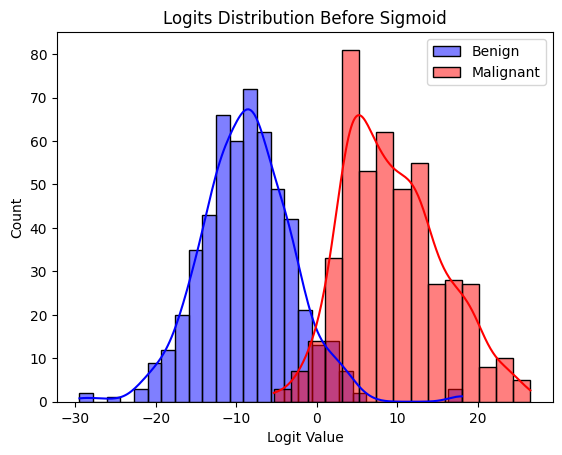

In [31]:
import seaborn as sns

# Get model outputs (logits) for test set
model.eval()
all_outputs = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs).cpu()
        all_outputs.append(outputs.squeeze())
        all_labels.append(labels.cpu())

all_outputs = torch.cat(all_outputs).numpy()
all_labels = torch.cat(all_labels).numpy()

# Plot the distribution of logits
sns.histplot(all_outputs[all_labels == 0], color="blue", label="Benign", kde=True)
sns.histplot(all_outputs[all_labels == 1], color="red", label="Malignant", kde=True)
plt.title("Logits Distribution Before Sigmoid")
plt.xlabel("Logit Value")
plt.legend()
plt.show()



In [35]:
!pip install grad-cam

  Using cached grad-cam-1.5.4.tar.gz (7.8 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached ttach-0.0.3-py3-none-any.whl.metadata (5.2 kB)
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=c7058f1fa993db4f3502c1c95c0929be98a844b3126dcae238398f2cde82adc7
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


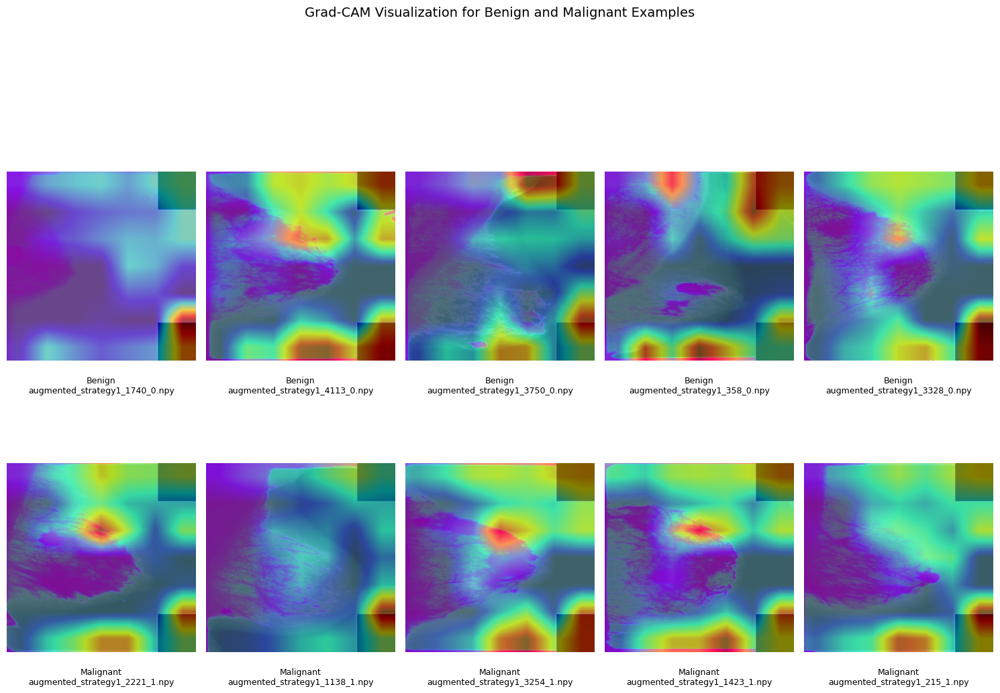

In [58]:
import numpy as np
import torch
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt
import os
import random
from torchvision import transforms

# Function to preprocess and generate Grad-CAM
def generate_grad_cam_npy(model, npy_path, target_layer):
    model.eval()

    # Load and preprocess the .npy image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    npy_image_tensor = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize using provided values
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image_tensor).unsqueeze(0).to(device)

    # Grad-CAM Initialization
    cam = GradCAM(model=model, target_layers=[target_layer])

    # Generate Grad-CAM
    grayscale_cam = cam(input_tensor=input_tensor, targets=None)
    grayscale_cam = grayscale_cam[0]  # Remove batch dimension

    # Reshape and normalize image for display
    npy_image_display = npy_image_tensor.permute(1, 2, 0).cpu().numpy()
    npy_image_display = (npy_image_display - npy_image_display.min()) / (npy_image_display.max() - npy_image_display.min())

    # Grad-CAM overlay
    visualization = show_cam_on_image(npy_image_display, grayscale_cam, use_rgb=True)

    return npy_image_display, visualization

# Function to plot 5 examples from benign and malignant directories
def plot_grad_cam_examples(model, benign_dir, malignant_dir, target_layer):
    benign_images = random.sample(os.listdir(benign_dir), 5)
    malignant_images = random.sample(os.listdir(malignant_dir), 5)

    plt.figure(figsize=(15, 12))

    # Process benign examples
    for i, img_name in enumerate(benign_images):
        npy_path = os.path.join(benign_dir, img_name)
        original, grad_cam = generate_grad_cam_npy(model, npy_path, target_layer)

        plt.subplot(2, 5, i + 1)
        plt.imshow(grad_cam)
        plt.axis("off")
        plt.title(f"Benign\n{img_name}", fontsize=9, y=-0.2)

    # Process malignant examples
    for i, img_name in enumerate(malignant_images):
        npy_path = os.path.join(malignant_dir, img_name)
        original, grad_cam = generate_grad_cam_npy(model, npy_path, target_layer)

        plt.subplot(2, 5, i + 6)
        plt.imshow(grad_cam)
        plt.axis("off")
        plt.title(f"Malignant\n{img_name}", fontsize=9, y=-0.2)

    plt.suptitle("Grad-CAM Visualization for Benign and Malignant Examples", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example Usage
benign_dir = "/kaggle/working/strategy1_dataset/benign"
malignant_dir = "/kaggle/working/strategy1_dataset/malignant"
target_layer = model.layer4[2]  # Final convolutional layer in layer4

plot_grad_cam_examples(model, benign_dir, malignant_dir, target_layer)


Region Focus:

- In benign images, the heatmaps may appear more diffuse or highlight random areas.
- In malignant images, the heatmaps are likely to focus on specific high-contrast or irregular regions.


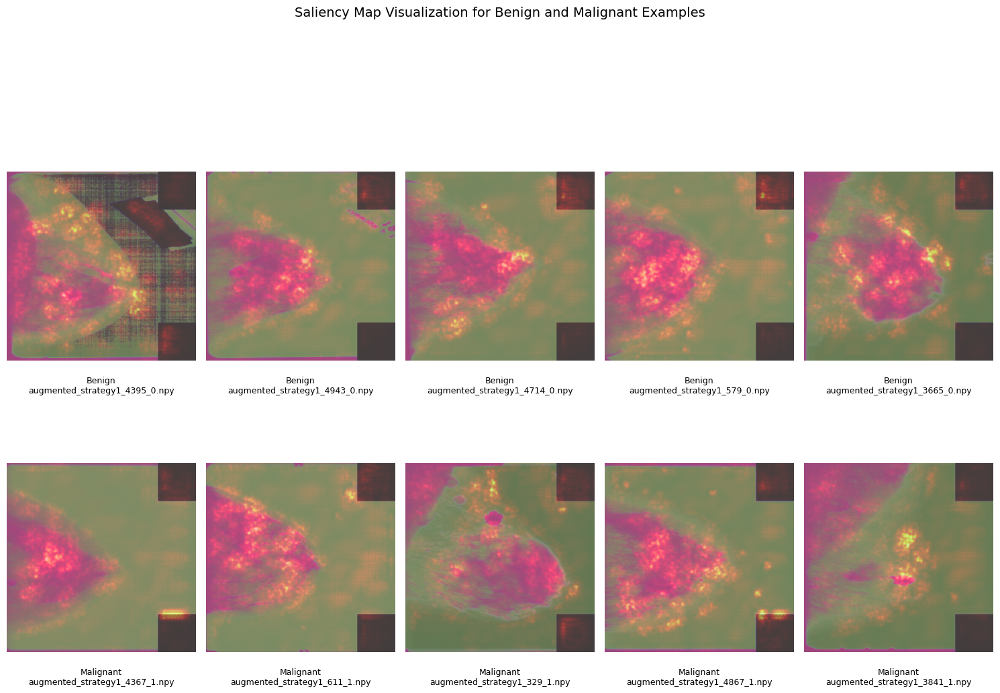

In [59]:
import numpy as np
import torch
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import os
import random
from torchvision import transforms

# Function to generate saliency map for a single .npy image
def generate_saliency_map_npy(model, npy_path):
    model.eval()

    # Load and preprocess the .npy image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    npy_image = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize image
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image).unsqueeze(0).to(device).requires_grad_()

    # Forward pass and compute gradients
    output = model(input_tensor)  # Shape: (1, 1)
    score = output[0]  # Logit for class 1
    model.zero_grad()
    score.backward()

    # Get saliency map
    saliency, _ = torch.max(input_tensor.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize saliency map
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    saliency_smoothed = gaussian_filter(saliency, sigma=1)  # Apply Gaussian smoothing

    # Prepare original image for visualization
    npy_image_np = npy_image.permute(1, 2, 0).cpu().numpy()
    npy_image_np = (npy_image_np - npy_image_np.min()) / (npy_image_np.max() - npy_image_np.min())

    return npy_image_np, saliency_smoothed

# Function to plot saliency maps for multiple examples
def plot_saliency_maps(model, benign_dir, malignant_dir):
    benign_images = random.sample(os.listdir(benign_dir), 5)
    malignant_images = random.sample(os.listdir(malignant_dir), 5)

    plt.figure(figsize=(15, 12))

    # Process benign examples
    for i, img_name in enumerate(benign_images):
        npy_path = os.path.join(benign_dir, img_name)
        original, saliency = generate_saliency_map_npy(model, npy_path)

        plt.subplot(2, 5, i + 1)
        plt.imshow(original, alpha=0.6)  # Original image
        plt.imshow(saliency, cmap="hot", alpha=0.4)  # Saliency overlay
        plt.axis("off")
        plt.title(f"Benign\n{img_name}", fontsize=9, y=-0.2)

    # Process malignant examples
    for i, img_name in enumerate(malignant_images):
        npy_path = os.path.join(malignant_dir, img_name)
        original, saliency = generate_saliency_map_npy(model, npy_path)

        plt.subplot(2, 5, i + 6)
        plt.imshow(original, alpha=0.6)  # Original image
        plt.imshow(saliency, cmap="hot", alpha=0.4)  # Saliency overlay
        plt.axis("off")
        plt.title(f"Malignant\n{img_name}", fontsize=9, y=-0.2)

    plt.suptitle("Saliency Map Visualization for Benign and Malignant Examples", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example Usage
benign_dir = "/kaggle/working/strategy1_dataset/benign"
malignant_dir = "/kaggle/working/strategy1_dataset/malignant"
plot_saliency_maps(model, benign_dir, malignant_dir) # It directly plot the saliency map overlapped on the original img to show critic points


Focus:

- Benign: Saliency maps are more dispersed, indicating the model's attention is not drawn to specific abnormalities.
- Malignant: Saliency maps are more focused and highlight distinct regions indicative of pathology.
